# REDES NEURNALES

Boletín 4: redes neuronales
Para la realización de las prácticas de esta tercera parte de la materia se utilizará scikit-learn, una
librería de aprendizaje estadístico en Python, a través de Jupyter Notebooks. La ejecución se realizará
en el CESGA siguiendo los pasos indicados en el archivo CESGA.pdf.


### Instrucciones para la experimentación en TODOS los boletines de prácticas

En los diferentes ejercicios que se realizarán durante el curso, existen una serie de operaciones con una componente aleatoria: la división en entrenamiento y test, el aprendizaje de un modelo o incluso, en
algunos casos, el test del modelo. Como norma general de experimentación es interesante asegurar la repetibilidad de los experimentos, eliminando la aleatoriedad, puesto que nos permite depurar errores,
comparar modelos, etc. Además, para la evaluación de los boletines también es imprescindible eliminar esa aleatoriedad.

Para ello vamos a fijar la semilla del generador de números aleatorios, de tal manera que su secuencia sea siempre la misma. La semilla se establece mediante el comando np.random.seed(SEED_VALUE), y
en este boletín utilizaremos un SEED_VALUE=1. Será necesario utilizar este comando inmediatamente antes de cualquier operación con un componente aleatorio. Esto incluye: train_test_split(), fit(),
predict(), etc. En aquellas funciones que lo admitan, sustituiremos el comando np.random.seed(SEED_VALUE) por el argumento random_state=SEED_VALUE.

In [1]:
!python --version

Python 2.7.15 :: Anaconda, Inc.


In [2]:
!python3 --version

/usr/bin/sh: python3: command not found


## Importamos las librerías a utilizar

In [31]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import PredefinedSplit
from sklearn.model_selection import GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.neural_network  import MLPRegressor
from sklearn.metrics import accuracy_score
import pickle
import matplotlib.pyplot as plt
import matplotlib

import os
import itertools

In [32]:
%matplotlib inline
matplotlib.style.use('ggplot')
#np.warnings.filterwarnings('ignore', category=np.VisibleDeprecationWarning)  # Para evitar warnings en algunas gráficas
import warnings

# Filtrar y ocultar todos los warnings
warnings.filterwarnings('ignore')

## Definimos variables globales

In [33]:
DATASET_NAME = './data/Exercice.data'
DATASET_DELIMITER = ','
SEED_VALUE = 1  # NO CAMBIES ESTA SEMILLA, así todos tendremos los mismos resultados

# Ejercicio 1

Se tiene una red neuronal con una capa oculta, sl={2, 3, 1}, W(1)= (-2, 1; 1, -1; 3, -1), W(2)= (2, 3, 1),
b(1)= (0; -1; 1), y b(2)= (0). La red utiliza la función de activación sigmoide en todas las neuronas salvo
la de salida, cuya función de activación es la identidad. Además, la función de coste es el error
cuadrático. Dado el ejemplo (1, 1, 1):

#### a) Calcula zi(l) y ai(l) para todas las neuronas.
#### b).Usando el algoritmo de retro-propagación del error, calcula δi(l) para todas las neuronas.
#### c) Usando el algoritmo de retro-propagación del error, determina los valores finales de cada peso (Wij(l)) y bias (bi(l)) de la red neuronal tras finalizar la primera iteración del algoritmo, asumiendo un valor de λ=1, y una tasa de aprendizaje α=0,5.

**Nota:** este ejercicio debe hacerse sin utilizar ninguna función de scikit-learn. Para realizar los
cálculos (multiplicación de matrices, etc.) se recomienda utilizar Python.


In [34]:
# supongamos una red fully connected es decir todos los nodos estan conectados a la siguente capa
import networkx as nx
class nodoclass:
    
    def __init__(self,conexion=[],bias=0,depth=0,ind=0,activation='identidad',show=False):
        
        self.conexion=conexion
        self.pesos=np.array([[i for i,j in self.conexion]])
        #print(self.conexion)
        self.bias=bias
        self.depth=depth
        self.ind=ind
        self.activation=activation
        self.show=show
        self.value_sin=self.actualice() if len(self.conexion)>0 else  1
        if self.activation=='sigmoide':
            self.value=self.activate_sigmoide(self.value_sin)
        else:
            self.value=self.value_sin
        
    def actualice(self):
        return np.sum(np.array([weigth*nodo.value 
                                    for i,(weigth,nodo) in enumerate(self.conexion)]))+self.bias
   
        
    def actualice_pesos(self,pesos,bias):
        if self.show:
            print('n',pesos)
        self.conexion=[[value,self.conexion[i][1]] for i,value in enumerate(pesos)]
        self.pesos=np.array([i for i,j in self.conexion])
        self.bias=bias
        
    def get_error(self,value,z1):
        if self.show:
            print('consiguiendo el error',np.array(self.pesos.T),value)
            print('nada',np.dot(self.pesos.T,value))
            print('z1',z1)
            print('z1 sig',self.sigmoid_derivative(z1) )
        return np.dot(self.pesos.T,value)*self.sigmoid_derivative(z1) 

    @staticmethod
    def activate_sigmoide(value):
        
        return 1 / (1 + np.exp(-value))
    
    # Derivada de la función sigmoide
    def sigmoid_derivative(self,value):
        return self.activate_sigmoide(value) * (1 - self.activate_sigmoide(value))
    
    def __str__(self):
        
        return '{}'.format(self.value)
    
    
    
class red_neuronal:
    def __init__(self,acquiterua,bias,show=False):
        """aquitectura lisa de pesos que tiene
        ejemplo  seria [[[-2,1,3],[1,-1,-1]],[[2,3,1]]]
        bias ejemplo [[0-1,1],[0]]
        """
        self.aquitectura_ini=acquiterua
        self.bias=bias
        self.red=self.generate()
        self.show=show
    def generate(self):
        
        capa_cero=[nodoclass(ind=i) for i in range(len(self.aquitectura_ini[0]))]
        #print(capa_cero)
        red=[]
        red.append(capa_cero)
        
        for i_capa, capa in enumerate(self.aquitectura_ini):
            
            #print(self.bias)
            capa=np.array(capa)
            bias=self.bias[i_capa]
            #values=[[peso,red[i_capa][id_nodo]] for id_nodo,peso in enumrate(pesos) for ind_peso,pesos in enumerate(capa.T)]
            #values=[[peso, red[i_capa][id_nodo]] for i_pesos, pesos in enumerate(capa.T) for id_nodo, peso in enumerate(pesos)]
            #print(capa.T,values)
            #capa_new=[nodoclass(conexion,bias[id_bias]) for id_bias,conexion in enumerate(values)]
            capa_new=[]
            for i_pesos, pesos in enumerate(capa.T):
                conexion=[[peso,red[i_capa][id_nodo]]  for id_nodo,peso in enumerate(pesos) ]
                #print('\n',i_pesos,str(conexion),'\n')
                if i_capa < len(self.aquitectura_ini)-1:
                    capa_new.append(nodoclass(conexion,bias[i_pesos],i_capa+1,i_pesos,'sigmoide'))
                else:
                    capa_new.append(nodoclass(conexion,bias[i_pesos],i_capa+1,i_pesos))
                #print(i_pesos,capa_new)
            red.append(capa_new)
        print(len(red))
        return red  
        
    def draw(self):
        G = nx.DiGraph()
        pos = {}
        pos_edge = {}
        labels = {}
        edge_labels = {}  # Etiquetas para las aristas
        node_size = 900  # Tamaño de los nodos
        # Crear nodos y etiquetas
        for i_capa, capa in enumerate(self.red):
            for nodo in capa:
                node_id = 'Capa {} - Nodo {}'.format(nodo.depth,nodo.ind)
                lista_nodos = list(G.nodes())
                #print(lista_nodos)
                G.add_node(node_id)
                pos[node_id] = (nodo.ind, -nodo.depth)  # Posición basada en capa e índice
                #pos_edge[node_id] = (nodo.ind-0.1, -nodo.depth+0.1)  # Posición basada en capa e índice
                labels[node_id] = 'Conexion:{}\
                \nValor: {}\
                \nValor_sin_activacion: {}\nBias: {}'.format(
                    [np.around(i,decimals=5) for i,j in nodo.conexion],nodo.value,nodo.value_sin,nodo.bias)

                # Crear aristas
                for peso, nodo_conexion in nodo.conexion:
                    target_id = 'Capa {} - Nodo {}'.format(i_capa - 1,nodo_conexion.ind)
                    #G.add_edge(node_id, target_id, weight=peso)
                    # invertimos el sentido de conaxion para darle la direcionalidad correcta
                    if self.show:
                        print(peso)
                    G.add_edge(target_id,node_id, weight=peso)
                    edge_labels[(target_id, node_id)] ='{:.2f}'.format(peso)
    
        # Dibujar el grafo
        plt.figure(figsize=(12, 8))
        #nx.draw(G, pos, labels=labels, with_labels=True, arrows=True,arrowstyle='->', arrowsize=40)
        #nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')
        nx.draw_networkx_nodes(G, pos, node_size=node_size)
        # ya que usamos las label en formato cuadrado eliminamos lo que no queriamos
        #nx.draw_networkx_labels(G, pos, labels=labels)
        edges = nx.draw_networkx_edges(
            G, pos, 
            arrowstyle='->', 
            arrowsize=40, 
            connectionstyle='arc3,rad=0.0',
            min_source_margin=15, 
            min_target_margin=30
        )
        
        nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red')

        # Draw the labels inside rectangles
        #for node, label in labels.items():
        #    x, y = pos[node]
        #    plt.text(x, y, label, ha='center', va='center', bbox=dict(facecolor='white', edgecolor='black'))
        # Etiquetas en rectángulos
        for node, label in labels.items():
            x, y = pos[node]
            plt.text(x, y, label, ha='center', va='center', bbox=dict(facecolor='white', edgecolor='black'))
   
        plt.axis('off')
        plt.show()

    def train(self,target=np.array([1]),lr=0.5,epochs=1):
        errores=[]
        for _ in range(epochs):
            for i_capa, capa in enumerate(reversed(self.red)):
                
                if i_capa>=len(self.red)-1:
                    break
                valor=np.array([nodo.value for  nodo in  capa])
                if i_capa>0:
                    our_before_capa=np.array([nodo.value_sin for i,nodo in enumerate(self.red[-i_capa-1])])
                    error=np.array([nodo.get_error(errores[-1],our_before_capa) for i,nodo in enumerate(self.red[-i_capa])])
                else:
                    error=valor-target
                if self.show:
                    print('es error',error,'cafe')
                errores.append(error)
        if self.show:
            print('errores',errores)        
        for i_capa, capa in enumerate(self.red):
            if i_capa>0:
                error_capa=lr*errores[-i_capa].T.dot(valores)
                
                for id_nodo,nodo in enumerate(capa):
                    if self.show:
                        print('capa',i_capa)
                        print(nodo.pesos,-errores[-i_capa],errores[-i_capa].T,valores)
                        print(errores[-i_capa].T)
                        print(valores)
                        print(error_capa)
                    new_pesos=nodo.pesos-error_capa[id_nodo]
                    bias=nodo.bias-lr*errores[-i_capa].T[id_nodo]
                    #print('\nnew',new_pesos[0],'\n pesoso ',np.dot(errores[-i_capa][id_nodo],valores),errores[-i_capa][id_nodo])
                    if self.show:
                        print('\nnew',new_pesos,'\n bias ',bias)
                    if isinstance(bias, (float, int)):  # Checks if bias is a scalar
                        nodo.actualice_pesos(new_pesos[0],bias)
                    else:
                        nodo.actualice_pesos(new_pesos[0],bias[0])
                        
            valores=np.array([[nodo.value for nodo in capa]])

In [35]:
arquitectura=[[[-2,1,3],[1,-1,-1]],[[2],[3],[1]]]
bias=[[0,-1,1],[0]]

In [36]:
red_new=red_neuronal(arquitectura,bias)

3


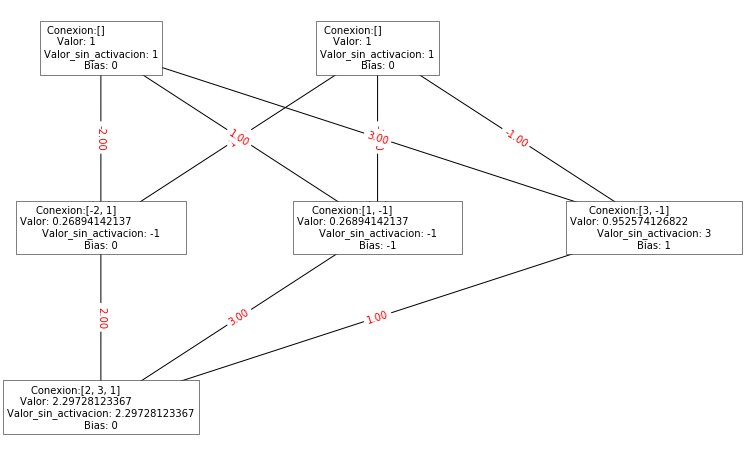

In [37]:
red_new.draw()

In [39]:
red_new.train()

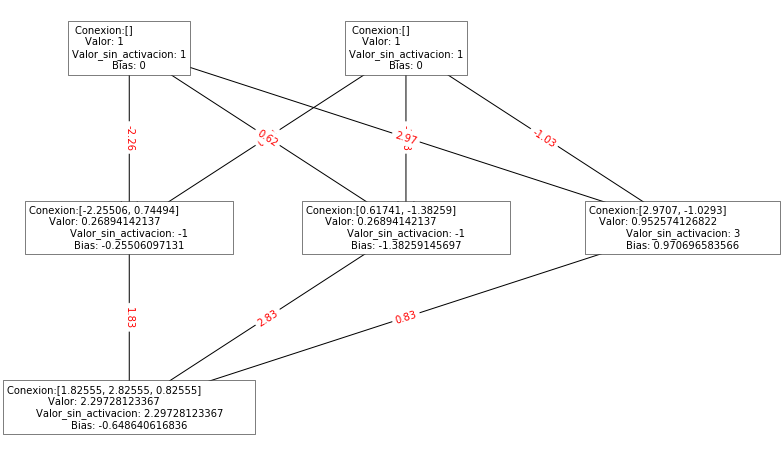

In [40]:
red_new.draw()

In [41]:
import numpy as np

# Función de activación sigmoide
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Datos de la red
W1 = np.array([[-2, 1], [1, -1], [3, -1]])  # Pesos de la primera capa
W2 = np.array([[2, 3, 1]])                 # Pesos de la segunda capa
b1 = np.array([[0], [-1], [1]])            # Bias de la primera capa
b2 = np.array([[0]])                       # Bias de la segunda capa
x = np.array([[1], [1]])                   # Entrada
y = np.array([[1]])                        # Salida deseada

# Cálculo de z y a para la primera capa
z1 = W1.dot(x) + b1
a1 = sigmoid(z1)

# Cálculo de z y a para la segunda capa (capa de salida)
z2 = W2.dot(a1) + b2
a2 = z2  # Función de activación identidad

W1,x,z1, a1, z2, a2


(array([[-2,  1],
        [ 1, -1],
        [ 3, -1]]), array([[1],
        [1]]), array([[-1],
        [-1],
        [ 3]]), array([[0.26894142],
        [0.26894142],
        [0.95257413]]), array([[2.29728123]]), array([[2.29728123]]))

In [42]:
# Derivada de la función sigmoide
def sigmoid_derivative(x):
    return sigmoid(x) * (1 - sigmoid(x))

# Cálculo del error en la capa de salida (capa 2)
delta2 = a2 - y

# Cálculo del error en la capa oculta (capa 1)
# Teniendo en cuenta que la función de activación es la sigmoide
delta1 = W2.T.dot(delta2) * sigmoid_derivative(z1)

delta1, delta2

(array([[0.51012194],
        [0.76518291],
        [0.05860683]]), array([[1.29728123]]))

In [43]:
# Tasa de aprendizaje
alpha = 0.5

# Actualización de los pesos y bias
# Para la primera capa
W1_new = W1 - alpha * delta1.dot(x.T)
b1_new = b1 - alpha * delta1

# Para la segunda capa
W2_new = W2 - alpha * delta2.dot(a1.T)
b2_new = b2 - alpha * delta2

W1_new, b1_new, W2_new, b2_new



(array([[-2.25506097,  0.74493903],
        [ 0.61740854, -1.38259146],
        [ 2.97069658, -1.02930342]]), array([[-0.25506097],
        [-1.38259146],
        [ 0.97069658]]), array([[1.82555367, 2.82555367, 0.38212173]]), array([[-0.64864062]]))

Como se pude obsevar el resultado es similar por lo que podemos saber que esta haceindo correctamente la división

# Ejercicio 2

Dado el problema de clasificación [Blood Transfusion Service Center](https://archive.ics.uci.edu/dataset/176/blood+transfusion+service+center):


**a)Analiza las características del conjunto de datos: número y tipo de variables de entrada y
salida, número de instancias, número de clases y distribución de las mismas, correlación
entre las variables, valores perdidos, etc.** 

## Leemos el fichero de datos

In [44]:
DATASET_BLOOD='./data/blood+transfusion+service+center/bloodTransfusion.data'
# Leer el archivo de datos y obtener la primera fila como nombres de columnas
data = pd.read_csv(DATASET_BLOOD)
NAME_BLOOD = data.columns.tolist()

NAME_BLOOD=["Reciente","Frecuencia","Cantidad_Sangre","Tiempo","Donacion_marzo"]
if os.path.exists(DATASET_BLOOD):
    dataset = pd.read_csv(DATASET_BLOOD, 
                          delimiter=DATASET_DELIMITER,
                          skiprows=1,
                          header=None,
                          names = NAME_BLOOD)
else:
    dataset = d.DataFrame(np.array(
    [[0, 3, 2, 1], 
    [3, 0, 3, 0], 
    [0, 3, -1, 0], 
    [3, 0, 0, 1], 
    [1, 2, 1, 1], 
    [2, 1, 0, 0]]), columns=['X1', 'X2', 'X3', 'Y'])
    
display(dataset)

,Reciente,Frecuencia,Cantidad_Sangre,Tiempo,Donacion_marzo
0,2,50,12500,98,1
1,0,13,3250,28,1
2,1,16,4000,35,1
3,2,20,5000,45,1
4,1,24,6000,77,0
5,4,4,1000,4,0
6,2,7,1750,14,1
7,1,12,3000,35,0
8,2,9,2250,22,1
9,5,46,11500,98,1


In [45]:
print('Tipo del dato de cada columna:')
print(dataset.dtypes)
# Comprobamos si hay nan
print("\n Cantidad de valores NaN en cada columna:")
dataset.isna().sum()

Tipo del dato de cada columna:
Reciente           int64
Frecuencia         int64
Cantidad_Sangre    int64
Tiempo             int64
Donacion_marzo     int64
dtype: object

 Cantidad de valores NaN en cada columna:


Reciente           0
Frecuencia         0
Cantidad_Sangre    0
Tiempo             0
Donacion_marzo     0
dtype: int64



Cada columna de este DataFrame representa la siguiente información:

- Reciente (Recency (months)): el número de meses que han pasado desde la última donación.
- Frecuencia (Frequency (times)): el número total de donaciones de esta persona.
- Cantidad_Sangre (Monetary (c.c. blood)): cantidad total de sangre donada en centímetros cúbicos (c.c.).
- Tiempo (Time (months)): el número de meses desde la primera donación de esta persona.
- Donacion_marzo (whether he/she donated blood in March 2007): la variable a predecir, que nos indica si esta persona donó o no en Marzo de 2007 (1 significa que donó mientras que 0 indica que no donó).

siendo la cantidad de instancias dentro del dataset de 748


## Visualizamos los datos

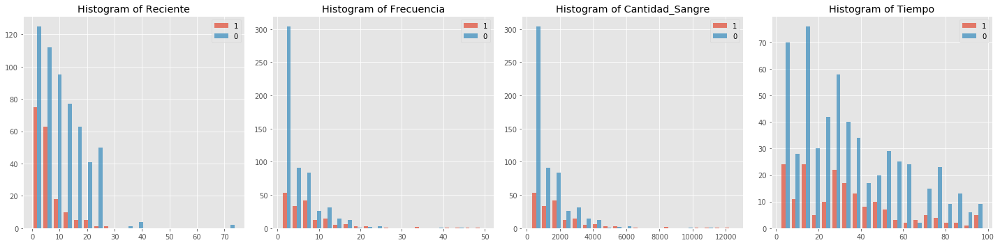

In [46]:
# Excluir la columna de la etiqueta
columns = dataset.columns[:-1]

# Crear una cuadrícula de subtramas 2x4 para histogramas y gráficos de dispersión
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Visualizar histogramas para todas las columnas
for i, column in enumerate(columns):
    axs[i].hist([dataset[dataset['Donacion_marzo'] == 1][column], 
                    dataset[dataset['Donacion_marzo'] == 0][column]], 
                   label=['1', '0'], bins=20, alpha=0.7)
    axs[i].set_title("Histogram of {}".format(column))
    axs[i].legend(loc='upper right')
# Ajustar el diseño
plt.tight_layout()
plt.show()



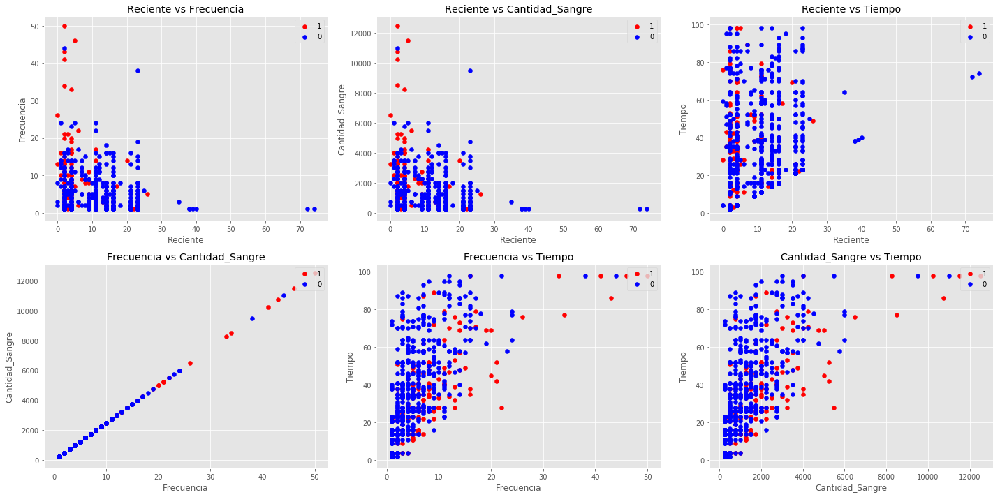

In [47]:
# Crear todas las combinaciones posibles de pares de variables
combinations = list(itertools.combinations(columns, 2))

# Calcular el número de filas necesario para acomodar todas las combinaciones
num_combinations = len(combinations)
num_rows = num_combinations // 3 + (num_combinations % 3 > 0)

# Crear una cuadrícula de subtramas con un número suficiente de filas para todas las combinaciones
fig, axs = plt.subplots(num_rows, 3, figsize=(20, num_rows * 5))  # Ajustar el tamaño de figura según sea necesario

# Visualizar gráficos de dispersión para todas las combinaciones
for j, (var1, var2) in enumerate(combinations):
    row = j // 3
    col = j % 3
    axs[row, col].scatter(dataset[dataset['Donacion_marzo'] == 1][var1], 
                          dataset[dataset['Donacion_marzo'] == 1][var2], 
                          c='red', label='1')
    axs[row, col].scatter(dataset[dataset['Donacion_marzo'] == 0][var1], 
                          dataset[dataset['Donacion_marzo'] == 0][var2], 
                          c='blue', label='0')
    axs[row, col].set_title("{} vs {}".format(var1, var2))
    axs[row, col].set_xlabel(var1)
    axs[row, col].set_ylabel(var2)
    axs[row, col].legend(loc='upper right')

# Ajustar el diseño para que no haya superposición
plt.tight_layout()

# Mostrar la figura
plt.show()

 **Nota**

- **Desequilibrio de Clases**: La primera fila de histogramas muestra un claro desequilibrio de clases entre aquellos que donaron sangre en marzo de 2007 (etiqueta '1') y aquellos que no lo hicieron (etiqueta '0'). Esto puede afectar el rendimiento del modelo de aprendizaje automático, ya que puede sesgarse hacia la clase más frecuente. Se recomienda aplicar técnicas de balanceo de clases como sobremuestreo, submuestreo o generación de datos sintéticos para manejar este desequilibrio.

- **Relación entre 'Frequency' y 'Monetary'**: La correlación directa entre 'Frequency' y 'Monetary' es evidente en el gráfico de dispersión de la esquina inferior derecha, lo que indica una relación lineal casi perfecta. Esto es coherente con la naturaleza de las variables, dado que 'Monetary' es probablemente un múltiplo de 'Frequency' (cada donación tiene un volumen fijo de sangre). Esto sugiere que una de las dos variables podría ser redundante para el modelado predictivo, y se podría considerar eliminar una para simplificar el modelo sin perder información significativa.

- **Posible correlación entre 'Time' y otras variables**: Los gráficos de dispersión 'Reciente vs Tiempo' y 'Frecuencia vs Tiempo' no muestran una relación lineal clara, pero sí sugieren algún tipo de relación. Por ejemplo, en 'Reciente vs Tiempo', hay una tendencia de que aquellos con valores más bajos de 'Reciente' tienen una distribución más amplia en 'Tiempo', lo que podría sugerir que los donantes nuevos tienden a tener un historial más corto de donaciones. Sin embargo, esta observación necesita ser investigada más a fondo, posiblemente con análisis estadísticos para establecer la fuerza y la significancia de la correlación.

- **Dispersión de los datos**: Hay una dispersión considerable en los datos, especialmente en los gráficos de dispersión 'Reciente vs Frecuencia' y 'Reciente vs Cantidad_Sangre', lo que podría indicar que la variable 'Reciente' tiene una relación menos directa con la frecuencia y la cantidad de donaciones en comparación con la relación entre 'Frecuencia' y 'Cantidad_Sangre'.


**PCA:** como observalos la relación entre 'Frequency' y 'Monetary' se podría hacer una reducción dimensional para mejorar el funconamiento de KNN 

**b)** División de los datos en entrenamiento (80%) y test (20%):

<span style="color:red">**MUY IMPORTANTE:**</span> Vamos a establecer una semilla con un valor predefinido inmediatamente antes de ejecutar cualquier operación con un componente aleatorio. Así aseguramos que nuestros resultados sean repetibles.

Esto es, vamos a poner `np.random.seed(SEED_VALUE)` antes de:
 - `fit()`
 - `predict()`
 
En aquellas funciones que lo admitan, sustituiremos el comando np.random.seed(SEED_VALUE) por el argumento `random_state=SEED_VALUE`. Por ejemplo, para la división de datos entre entrenamiento y test con `train_test_split`.

In [48]:
# tenemos mas ejemplos de una categoria que en otra si queremos hacer una experimentación para el conjunto de test 
# con stratify mantenga el mismo poncentaje de cadad clase  en el test y en el train en este 
# caso es para que train si hay 2 categorias mantenga la proporcion de estas en train y test decir que si en el total 
# tenemos 60% 1 y 40% 2 se intenta man tener el porcentaje de dataos 
dataset_train, dataset_test = train_test_split(dataset,
                            test_size=0.2, random_state=SEED_VALUE,
                                              stratify=dataset["Donacion_marzo"])
print(dataset_test.shape)
display(dataset_test.head())

(150, 5)


,Reciente,Frecuencia,Cantidad_Sangre,Tiempo,Donacion_marzo
309,16,3,750,19,0
711,23,6,1500,45,0
343,11,1,250,11,0
462,21,1,250,21,1
646,14,2,500,14,0


## Gestión de valores faltantes

En este caso, nuestro dataset no tiene valores faltantes.
Sin embargo, la sustitución de las variables predictoras por la media se llevaría a cabo de la siguiente manera. 

In [49]:
#imp = SimpleImputer(missing_values=np.nan, fill_value='mean')
#imp = imp.fit(dataset_train)  # La media la calculamos SÓLO a partir del conjunto de train

# Los valores van a ser los mismos que antes, pues no tenemos datos faltantes
#dataset_train_prep = imp.transform(dataset_train)
#dataset_test_prep = imp.transform(dataset_test)

#dataset_test_prep

`SimpleImputer` ha convertido nuestros valores a un array NumPy, por lo que sería bueno que los volviéramos a convertir en formato dataframe.

In [50]:
#dataset_train = pd.DataFrame(dataset_train_prep,
#                             columns=dataset_train.columns,
#                             index=dataset_train.index)
#dataset_test = pd.DataFrame(dataset_test_prep,
#                            columns=dataset_test.columns,
#                            index=dataset_test.index)

#dataset_test

## Separación de variables predictoras y dependientes

In [51]:
dataset_train_X = dataset_train.loc[:, NAME_BLOOD[:-1]].astype(float)
dataset_train_Y = dataset_train.loc[:, NAME_BLOOD[-1]]

print("dimension:",dataset_train_X.shape)
display(dataset_train_X.head())


('dimension:', (598, 4))


,Reciente,Frecuencia,Cantidad_Sangre,Tiempo
619,4.0,1.0,250.0,4.0
357,14.0,3.0,750.0,26.0
405,14.0,3.0,750.0,41.0
700,16.0,3.0,750.0,35.0
479,23.0,1.0,250.0,23.0


In [52]:
dataset_test_X = dataset_test.loc[:, NAME_BLOOD[:-1]].astype(float)
dataset_test_Y = dataset_test.loc[:, NAME_BLOOD[-1]]

print("dimension:",dataset_train_X.shape)
display(dataset_test_X.head())

('dimension:', (598, 4))


,Reciente,Frecuencia,Cantidad_Sangre,Tiempo
309,16.0,3.0,750.0,19.0
711,23.0,6.0,1500.0,45.0
343,11.0,1.0,250.0,11.0
462,21.0,1.0,250.0,21.0
646,14.0,2.0,500.0,14.0


## Estandarización de los datos

Esto hay que hacerlo **DESPUÉS** de dividir en conjuntos de entrenamiento y test.

Además, como es un problema de clasificación, **NO** estandarizaremos la variable dependiente. 

**IMPORTANTE : EN ESTE CASO  ES NECESARIO USAR LA ESTANDARIZACIÓN POR COMO SE COMPORTAN LAS REDES NEURONALES**

In [53]:
scaler = StandardScaler()

scaler.fit(dataset_train_X)

dataset_train_X_scaled = scaler.transform(dataset_train_X)
dataset_test_X_scaled = scaler.transform(dataset_test_X)

#dataset_test_X_scaled

Estos son los valores con los que se ha estandarizado.

In [54]:
print("mean {}: {}  |  std {}: {}".format(NAME_BLOOD[:-1],scaler.mean_, NAME_BLOOD[:-1],scaler.scale_))

mean ['Reciente', 'Frecuencia', 'Cantidad_Sangre', 'Tiempo']: [   9.5083612     5.63712375 1409.28093645   34.87959866]  |  std ['Reciente', 'Frecuencia', 'Cantidad_Sangre', 'Tiempo']: [   7.89304107    5.89317612 1473.29403119   24.72995729]


## Empezamos con la experimentación de clasificación con arboles

Hemos visualizado y preprocesado los datos. Vamos a empezar a trabajar con nuestro predictor.

## Definimos un rango de hiperparámetros para realizar las pruebas

In [56]:

# Expected n_neighbors <= n_samples,  n_samples = 477
# Si solo necesitas el número de muestras
n_samples = dataset_train_X_scaled.shape[0]

n_hidden_layers_array = range(1, 4)  # Capas ocultas de 1 a 3
n_neurons_per_layer_array = range(1, 50)  # Neuronas por capa de 1 a 20 YA QUE EN EL ORDENADOR LOCAL SE COMPROBO 
# que habia un comportamiento muy distinto apartir de este valor
alpha_exp_array = range(-5, 1)  # Exponentes de 10 para alpha, de -4 a 1 se usa este alpha por el comportamiento obsevado 
# en el ordenador local

# Generación de tamaños de capas ocultas
hidden_layer_sizes = [(neurons,) * layers for layers in n_hidden_layers_array for neurons in n_neurons_per_layer_array]

# Generación de valores para alpha
# Generación de valores para alpha
# se comprobo que no
alpha_values = [10**exp for exp in alpha_exp_array] + [5 * 10**exp for exp in alpha_exp_array]
alpha_values = sorted(set(alpha_values))  # Eliminar duplicados y ordenar

hyperparameters = {'hidden_layer_sizes': hidden_layer_sizes, 
                   'alpha': alpha_values}



## Comenzamos las pruebas con 5-CV

In [57]:
# probaremos mas iteraciones por recomendacion de los warnings
neural_network = MLPClassifier(activation='tanh', solver='lbfgs', max_iter=2000, random_state=SEED_VALUE)
modelCV = GridSearchCV(neural_network,
                       hyperparameters,
                       cv=5,
                       scoring='accuracy', # parametro  top mejores en regresion mean scare error(skle pueda dar - std)
                       return_train_score=True,
                       n_jobs=-1)  # El warning es normal, pues el ejemplo es demasiado pequeño

np.random.seed(SEED_VALUE)  # Por como funciona KNN, no haría falta establecer una semilla. Pero lo ponemos igualmente
modelCV.fit(dataset_train_X_scaled, dataset_train_Y)  # En KNN no hay aprendizaje en sí, pero hay que ejecutar este comando para poder hacer inferencias

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=MLPClassifier(activation='tanh', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=2000, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=1, shuffle=True, solver='lbfgs', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'alpha': [1e-05, 5e-05, 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5], 'hidden_layer_sizes': [(1,), (2,), (3,), (4,), (5,), (6,), (7,), (8,), (9,), (10,), (11,), (12,), (13,), (14,), (15,), (16,), (17,), (18,), (19,), (20,), (21,), (22,), (23,), (24,), (25,), (26,), (27,), (2..., (43, 43, 43), (44, 44, 44), (45, 45, 45), (46, 46, 46), (47, 47, 47), (48, 48, 48), (49, 49, 49)]},
       pre_dispat

In [60]:
!pip install joblib

    100% |████████████████████████████████| 296kB 4.1MB/s eta 0:00:01
Could not install packages due to an EnvironmentError: [Errno 13] Permission denied: '/opt/cesga/anaconda/Anaconda2-2018.12/lib/python2.7/site-packages/joblib-0.14.1.dist-info'
Consider using the `--user` option or check the permissions.



In [61]:
import joblib  # Para guardar el modelo

ImportError: No module named joblib

In [ ]:

joblib.dump(modelCV, 'mejor_modelo_mlp_cesga.joblib')

Muestra la gráfica del error de entrenamiento con validación cruzada (5-CV) frente al valor
del hiper-parámetro.
**¿Cuál es el menor error de validación cruzada, su desviación estándar
y el valor del hiper-parámetro para el que se consigue? ¿Cuál es el valor del hiper-
parámetro si se aplicase la regla de una desviación estándar? En caso de que haya varios
modelos con error mínimo, debe seleccionarse siempre el más simple (cuantos mas vecinos mas simple por que la frontera de decisión es mas suave).**

In [ ]:
with open('mejor_modelo_mlp_cesga.pkl', 'wb') as f:
    pickle.dump(model, f, protocol=pickle.HIGHEST_PROTOCOL)

## Resultados obtenidos en 5-CV

Puede verse el ranking de los mejores

In [62]:
cv_results = pd.DataFrame(modelCV.cv_results_)
columnas_plot=['param_hidden_layer_sizes','param_alpha','mean_test_score', 'std_test_score', 'rank_test_score']
cv_results.loc[:,columnas_plot]


,param_hidden_layer_sizes,param_alpha,mean_test_score,std_test_score,rank_test_score
0,"(1,)",1e-05,0.782609,0.031688,336
1,"(2,)",1e-05,0.770903,0.037766,465
2,"(3,)",1e-05,0.777592,0.017083,429
3,"(4,)",1e-05,0.765886,0.031799,489
4,"(5,)",1e-05,0.790970,0.010109,248
5,"(6,)",1e-05,0.760870,0.045630,516
6,"(7,)",1e-05,0.785953,0.034427,310
7,"(8,)",1e-05,0.764214,0.022395,498
8,"(9,)",1e-05,0.759197,0.034397,526
9,"(10,)",1e-05,0.745819,0.020359,612


In [ ]:
modelo_cargado = joblib.load('mejor_modelo_mlp_cesga.joblib')
cv_results = pd.DataFrame(modelo_cargado.cv_results_)
columnas_plot=['param_hidden_layer_sizes','param_alpha','mean_test_score', 'std_test_score', 'rank_test_score']
cv_results.loc[:,columnas_plot]


Los mejores hiperparámetros en validación serían los siguientes (aunque no siempre conviene quedarse con los mejores):

In [20]:
cv_results_best = cv_results[cv_results['rank_test_score'] == 1]
cv_results_best.loc[:, columnas_plot]

,param_hidden_layer_sizes,param_alpha,mean_test_score,std_test_score,rank_test_score
1325,"(3,)",0.5,0.805994,0.029822,1


En el contexto de los árboles de decisión, un modelo más simple suele ser aquel con mayor valor de min_samples_split, ya que esto conduce a un árbol menos profundo y, por lo tanto, a un modelo más general. 

## Gráfica de entrenamiento

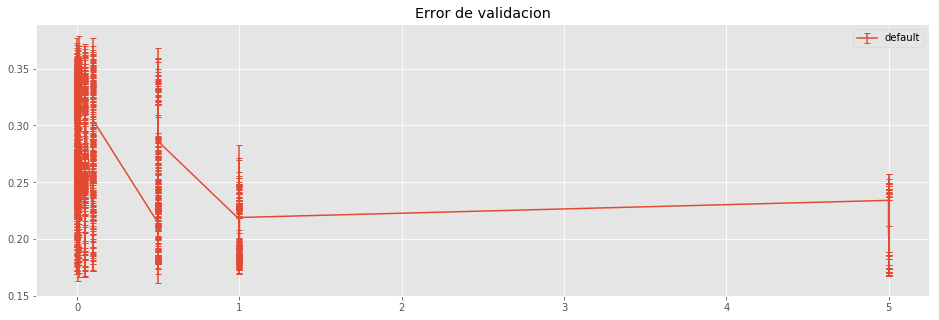

In [63]:
# separamos los pesos basados en cada 
cv_results_uniform = cv_results

plt.figure(figsize=(16, 5))  # Puedes cambiar estos valores según tus necesidades
# eje x xantidad de vecinos y en el y cuanto es el errror
plt.title("Error de validacion")
plt.errorbar(cv_results_uniform['param_alpha'],1 - cv_results_uniform['mean_test_score'],
             cv_results_uniform['std_test_score'], label='default', capsize=3)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

Se observa que apartir de ciento numero de vecinos el error es constante y con la misma variación por lo que haremos un acercamiento a a la parte del grafico que  tiene variación para poder observar mejor esta sección. 

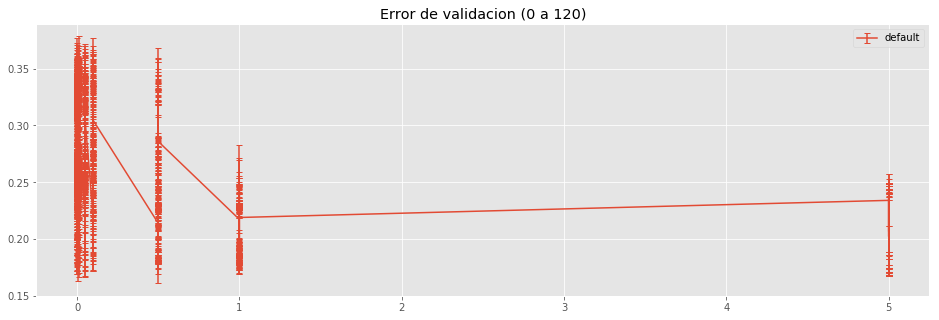

In [64]:
# Primera gráfica: De 0 a 110
plt.figure(figsize=(16, 5))
plt.title("Error de validacion (0 a 120)")
subset = cv_results_uniform[cv_results_uniform['param_alpha'] <= 10]
plt.errorbar(subset['param_alpha'],1 - subset['mean_test_score'],
             subset['std_test_score'], label='default', capsize=3)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

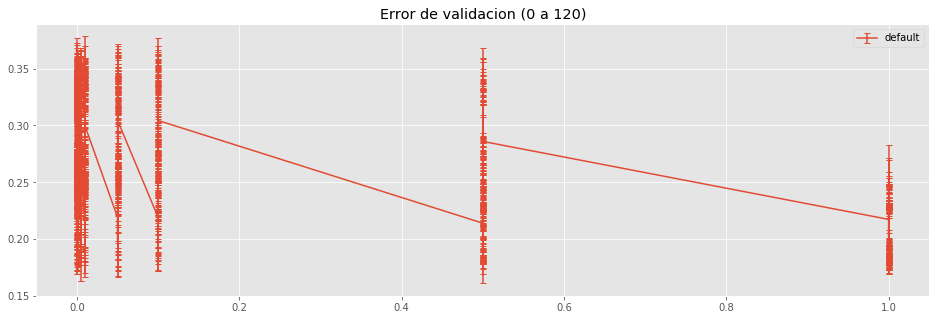

In [65]:
# Primera gráfica: De 0 a 110
plt.figure(figsize=(16, 5))
plt.title("Error de validacion (0 a 120)")
subset = cv_results_uniform[cv_results_uniform['param_alpha'] <= 1]
plt.errorbar(subset['param_alpha'],1 - subset['mean_test_score'],
             subset['std_test_score'], label='default', capsize=3)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

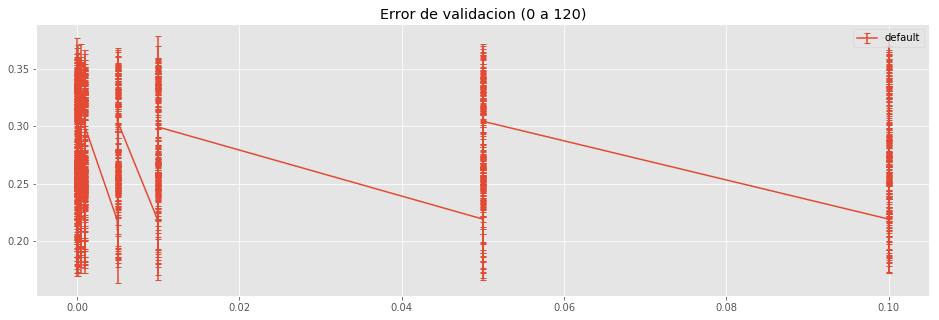

In [66]:
# Primera gráfica: De 0 a 110
plt.figure(figsize=(16, 5))
plt.title("Error de validacion (0 a 120)")
subset = cv_results_uniform[cv_results_uniform['param_alpha'] <= 0.1]
plt.errorbar(subset['param_alpha'],1 - subset['mean_test_score'],
             subset['std_test_score'], label='default', capsize=3)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

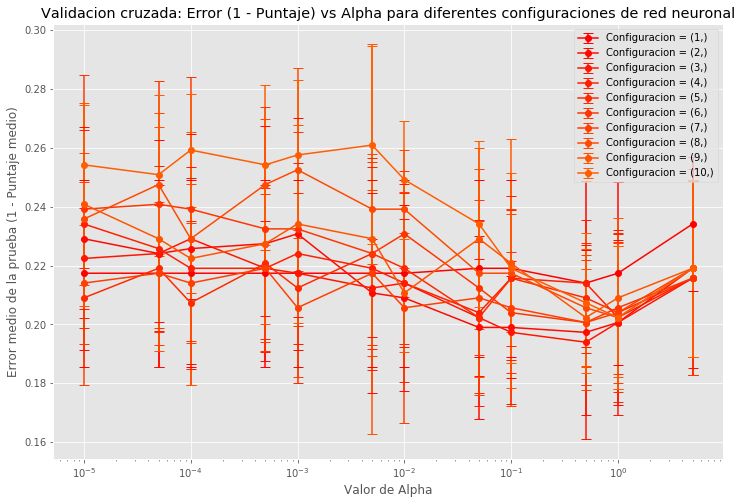

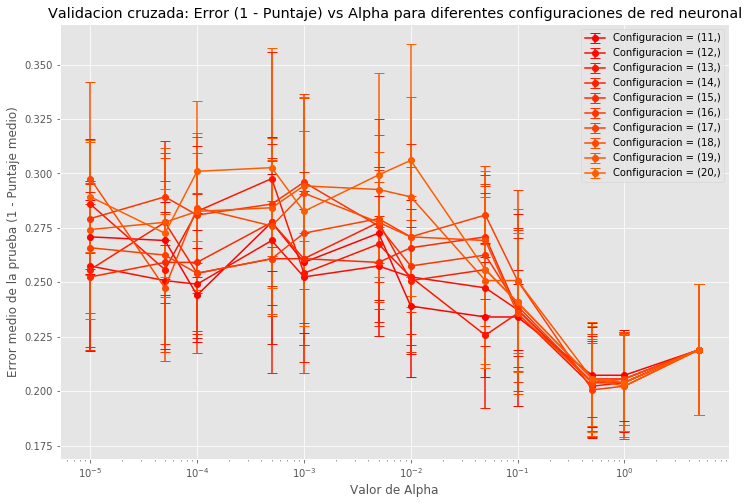

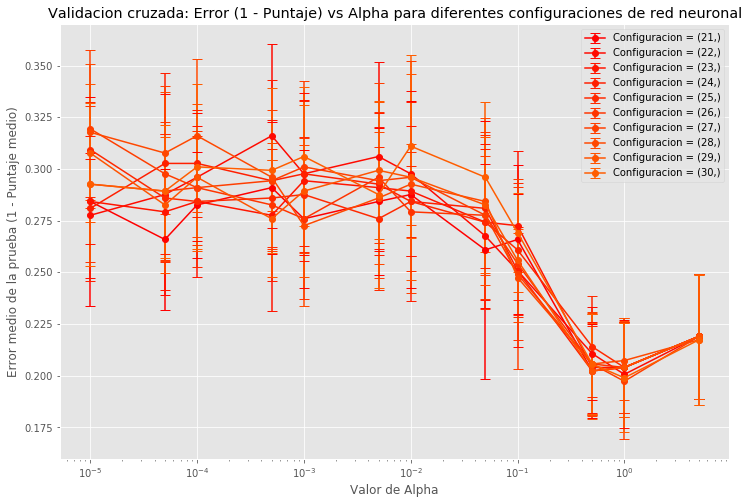

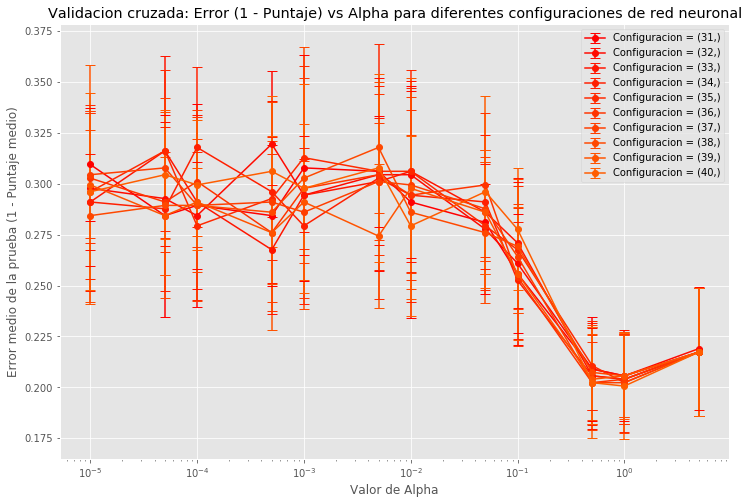

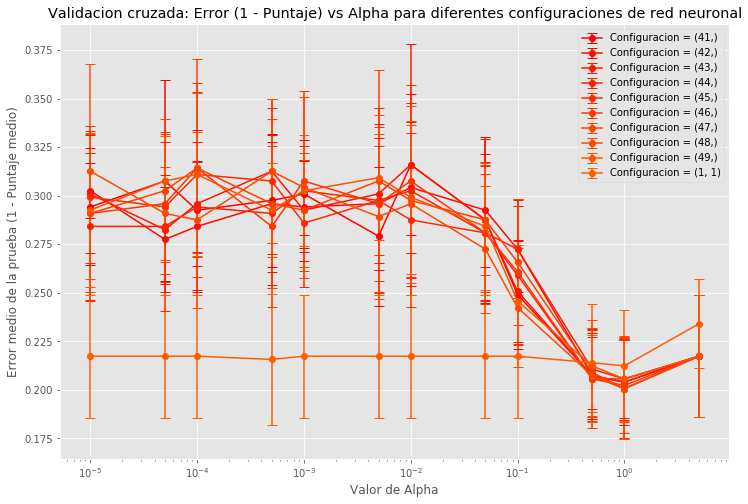

...

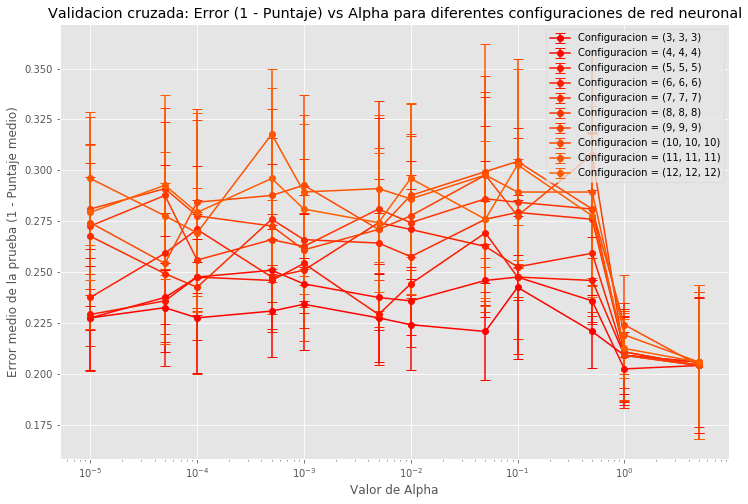

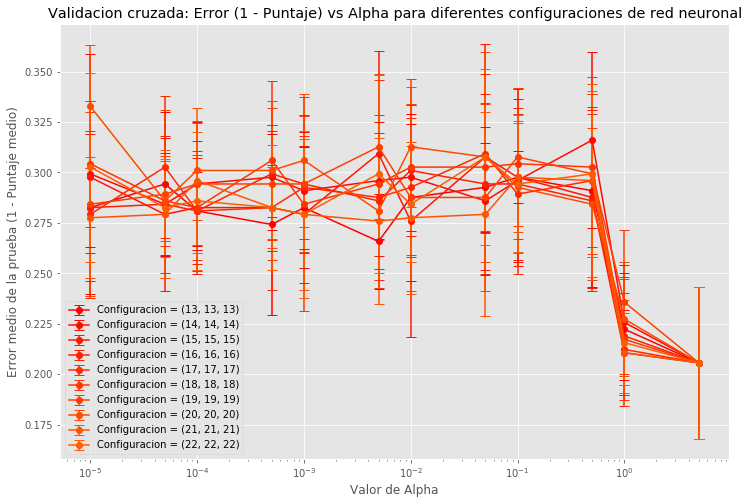

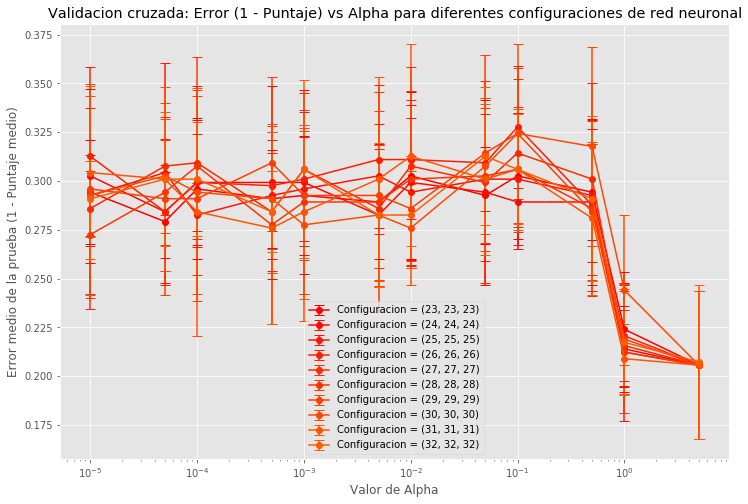

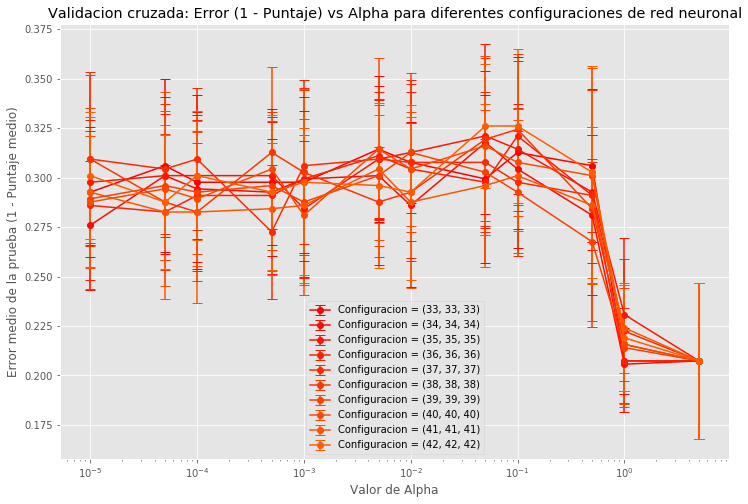

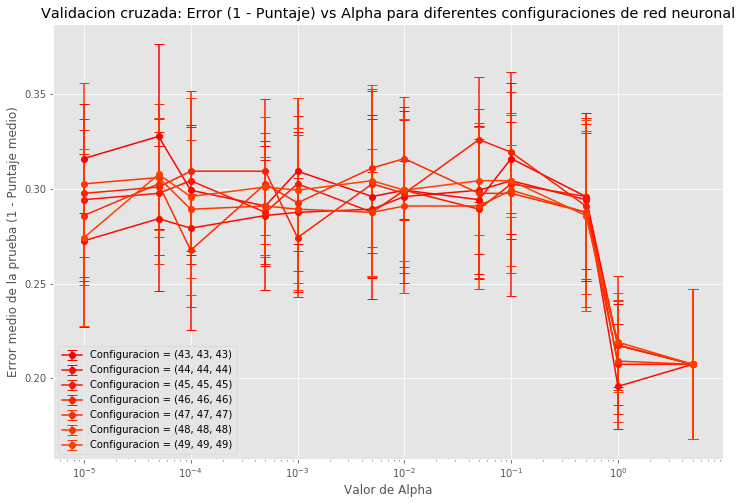

In [81]:
df = cv_results_uniform[cv_results_uniform['param_alpha'] <= 10]

# Asumiendo que quieres mostrar solo un cierto número de configuraciones de red neuronal por gráfica
num_configuraciones_por_grafica = 10

# Dividir las configuraciones de la red neuronal en grupos
unique_configs = df['param_hidden_layer_sizes'].unique()
config_groups = [unique_configs[i:i + num_configuraciones_por_grafica] for i in range(0, len(unique_configs), num_configuraciones_por_grafica)]
palette = plt.cm.get_cmap("hsv", len(unique_configs))
for group in config_groups:
    plt.figure(figsize=(12, 8))
    for idx, config in enumerate(group):
        df_config = df[df['param_hidden_layer_sizes'] == config]
        plt.errorbar(df_config['param_alpha'], 1 - df_config['mean_test_score'], 
                     yerr=df_config['std_test_score'], fmt='o-', 
                     capsize=5, color=palette(idx), label='Configuracion = {}'.format(config))
    plt.title('Validacion cruzada: Error (1 - Puntaje) vs Alpha para diferentes configuraciones de red neuronal')
    plt.xlabel('Valor de Alpha')
    plt.ylabel('Error medio de la prueba (1 - Puntaje medio)')
    plt.xscale('log')
    plt.legend()
    plt.show()


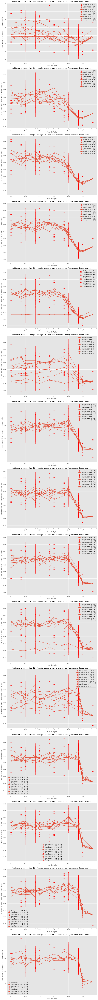

In [82]:

# Filtrar por valores de alpha menores o iguales a 10
df = cv_results_uniform[cv_results_uniform['param_alpha'] <= 10]

# Dividir las configuraciones de la red neuronal en grupos
unique_configs = df['param_hidden_layer_sizes'].unique()
config_groups = [unique_configs[i:i + num_configuraciones_por_grafica] for i in range(0, len(unique_configs), num_configuraciones_por_grafica)]

# Número de filas y columnas para los subplots
n_rows = len(config_groups)
n_cols = 1  # Una columna con múltiples filas

# Crear subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 8 * n_rows))

if n_rows == 1:  # Si solo hay una fila, convertir axes en una lista
    axes = [axes]

for idx, group in enumerate(config_groups):
    ax = axes[idx]
    for config in group:
        df_config = df[df['param_hidden_layer_sizes'] == config]
        ax.errorbar(df_config['param_alpha'], 1 - df_config['mean_test_score'], 
                    yerr=df_config['std_test_score'], fmt='o-', ecolor='red',
                    capsize=5, label='Configuracion = {}'.format(config))
    ax.set_title('Validacion cruzada: Error (1 - Puntaje) vs Alpha para diferentes configuraciones de red neuronal')
    ax.set_xlabel('Valor de Alpha')
    ax.set_ylabel('Error medio de la prueba (1 - Puntaje medio)')
    ax.set_xscale('log')
    ax.legend()

plt.tight_layout()
plt.show()

In [83]:
cv_results_best = cv_results[cv_results['rank_test_score'] == 1].sort_values(by='param_hidden_layer_sizes')
cv_results_best.loc[:, columnas_plot]

,param_hidden_layer_sizes,param_alpha,mean_test_score,std_test_score,rank_test_score
1325,"(3,)",0.5,0.80602,0.032928,1


In [84]:
best_value=cv_results_best.loc[:, columnas_plot]
best_value_ind=best_value.index[-1]
best_value_ind

1325

**Para validación cruzada**

In [85]:
display(cv_results.loc[best_value_ind:best_value_ind, columnas_plot])

,param_hidden_layer_sizes,param_alpha,mean_test_score,std_test_score,rank_test_score
1325,"(3,)",0.5,0.80602,0.032928,1


Muestra la gráfica del error de test frente al valor del hiper-parámetro, y valora si la gráfica
del error de entrenamiento con validación cruzada ha hecho una buena estimación del error de test.**¿Cuál es el error de test para el valor del hiper-parámetro seleccionado por la validación cruzada?**

## Verificación de nuestros hiperparámetros

Esto no se haría **JAMÁS** en una situación real.
Pero como este es un ejemplo para aprender, vamos a ver cómo de lejos nos hemos quedado de los hiperparámetros "ideales".

Hacemos un Grid Search utilizando el conjunto de entrenamiento al completo (80% de los datos) y nuestro conjunto de validación va a ser el conjunto de test (20% de los datos).

In [86]:
# Hacemos un Grid Search sin Cross Validation, únicamente con entrenamieto y validación (PredefinedSplit)

# Creamos una lista con `-1` para los índices de entrenamiento y `0` para los índices de validación
split_test_fold = [-1]*len(dataset_train_Y) + [0]*len(dataset_test_Y)
ps = PredefinedSplit(test_fold=split_test_fold)

# Juntamos los conjuntos de entrenamiento y test, fingiendo que son un sólo conjunto de entrenamiento-validación
dataset_all_X_scaled = np.vstack([dataset_train_X_scaled, dataset_test_X_scaled])
dataset_all_Y = pd.concat([dataset_train_Y, dataset_test_Y])

# probaremos mas iteraciones por recomendacion de los warnings
neural_network = MLPClassifier(activation='tanh', solver='lbfgs', max_iter=2000, random_state=SEED_VALUE)
modelCV_test = GridSearchCV(neural_network,
                       hyperparameters,
                       cv=5,
                       scoring='accuracy', # parametro  top mejores en regresion mean scare error(skle pueda dar - std)
                       return_train_score=True,
                       n_jobs=-1)  # El warning es normal, pues el ejemplo es demasiado pequeño

np.random.seed(SEED_VALUE)  # Por como funciona KNN, no haría falta establecer semilla. Pero lo ponemos igualmente
modelCV_test.fit(dataset_all_X_scaled, dataset_all_Y)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=MLPClassifier(activation='tanh', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100,), learning_rate='constant',
       learning_rate_init=0.001, max_iter=2000, momentum=0.9,
       n_iter_no_change=10, nesterovs_momentum=True, power_t=0.5,
       random_state=1, shuffle=True, solver='lbfgs', tol=0.0001,
       validation_fraction=0.1, verbose=False, warm_start=False),
       fit_params=None, iid='warn', n_jobs=-1,
       param_grid={'alpha': [1e-05, 5e-05, 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5], 'hidden_layer_sizes': [(1,), (2,), (3,), (4,), (5,), (6,), (7,), (8,), (9,), (10,), (11,), (12,), (13,), (14,), (15,), (16,), (17,), (18,), (19,), (20,), (21,), (22,), (23,), (24,), (25,), (26,), (27,), (2..., (43, 43, 43), (44, 44, 44), (45, 45, 45), (46, 46, 46), (47, 47, 47), (48, 48, 48), (49, 49, 49)]},
       pre_dispat

In [87]:
joblib.dump(modelCV_test, 'mejor_modelo_mlp_test.joblib')

NameError: name 'joblib' is not defined

In [89]:
#modelCV_test = modelCV_test.load('mejor_modelo_mlp_test.joblib')
test_results = pd.DataFrame(modelCV_test.cv_results_)
test_results.loc[:, columnas_plot].head()

,param_hidden_layer_sizes,param_alpha,mean_test_score,std_test_score,rank_test_score
0,"(1,)",1e-05,0.775401,0.029639,426
1,"(2,)",1e-05,0.779412,0.029608,391
2,"(3,)",1e-05,0.802139,0.025334,36
3,"(4,)",1e-05,0.776738,0.029085,418
4,"(5,)",1e-05,0.786096,0.010856,284


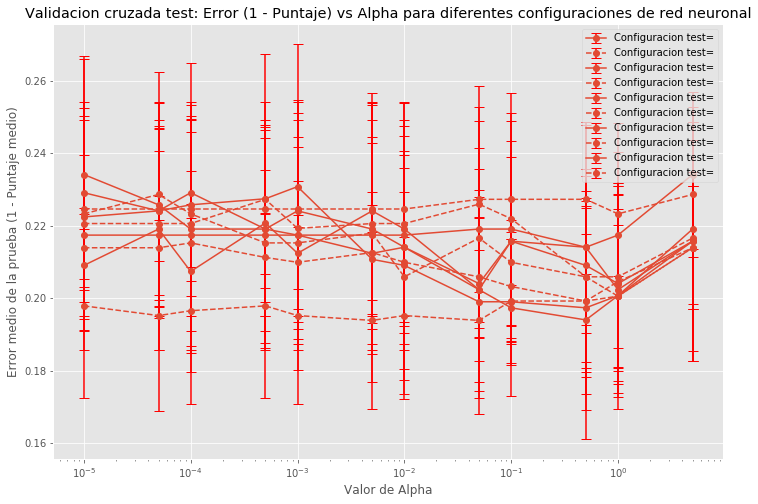

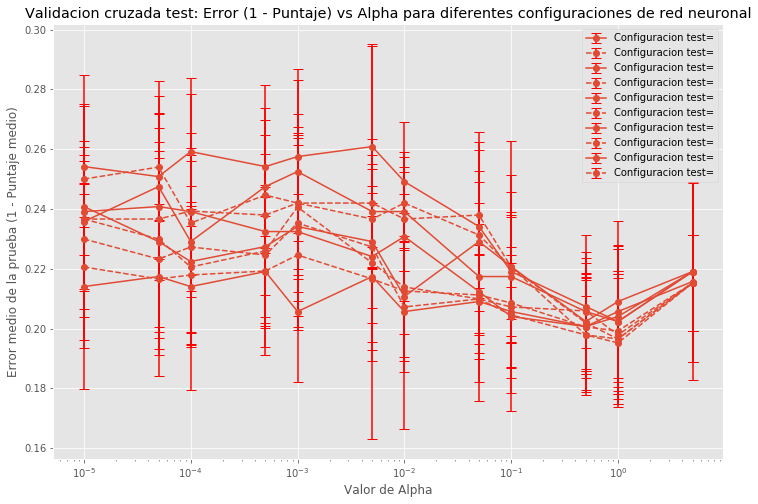

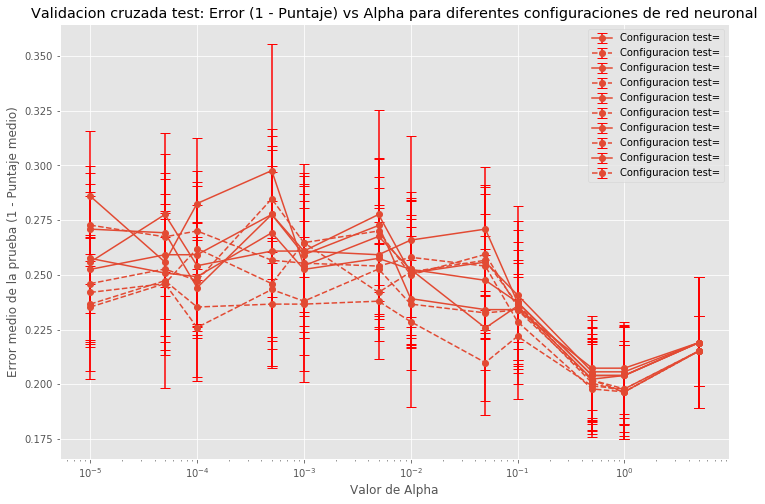

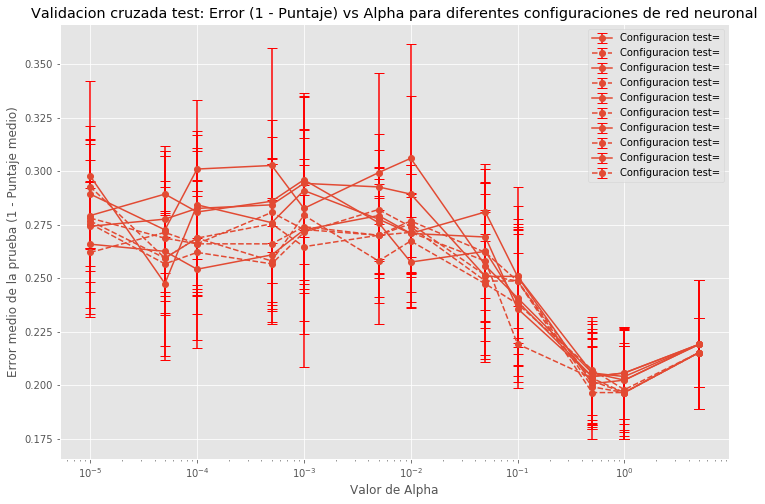

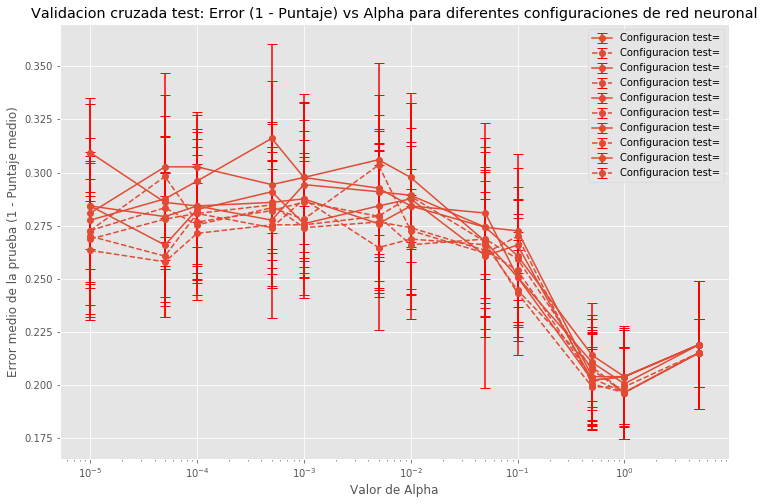

...

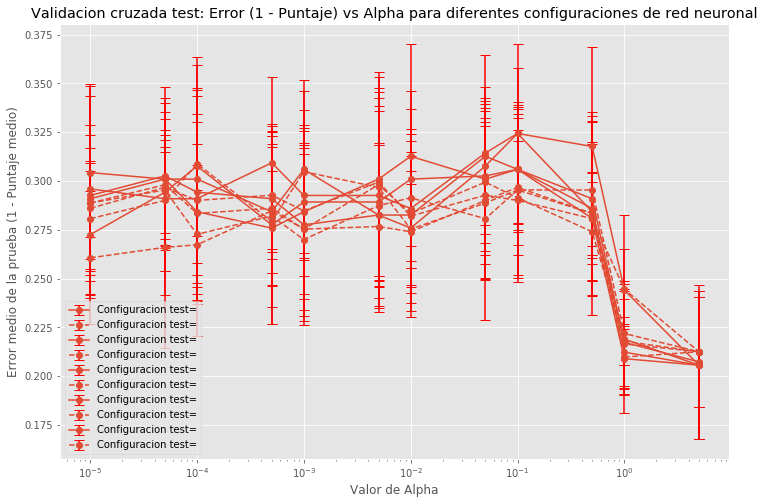

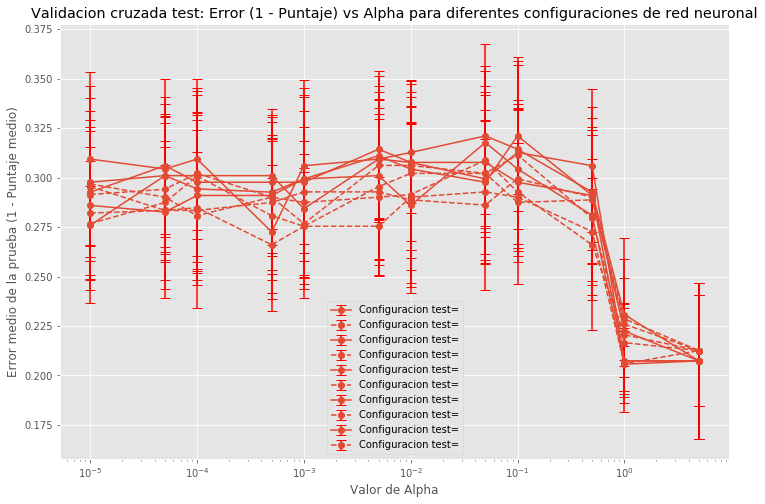

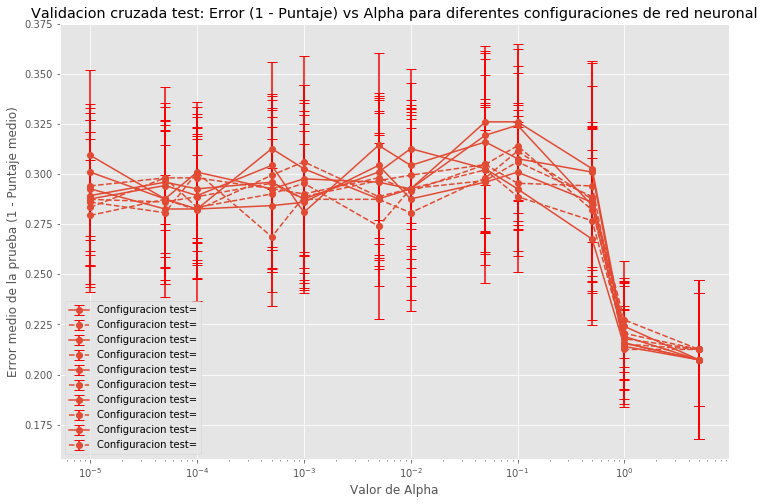

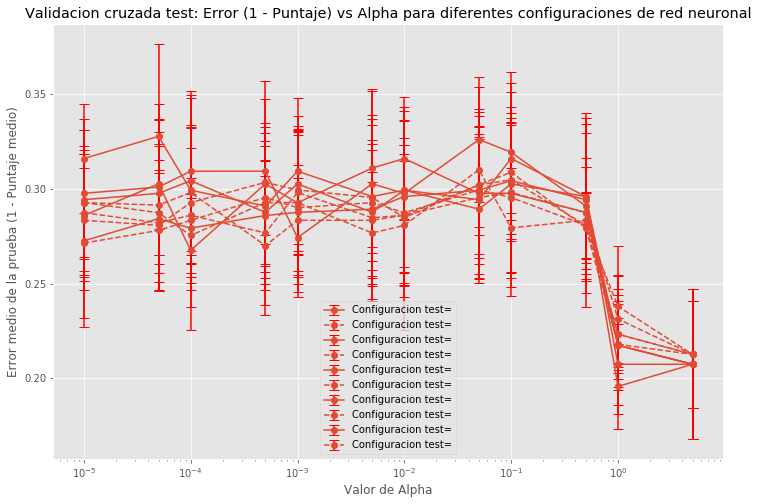

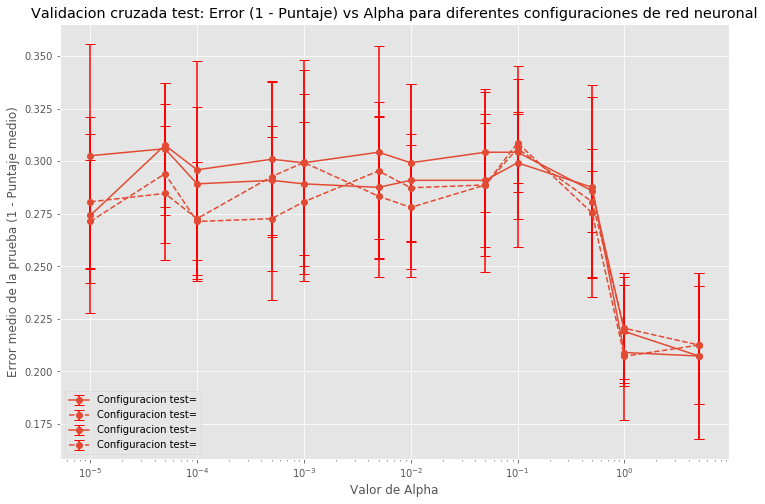

In [93]:
df = cv_results_uniform[cv_results_uniform['param_alpha'] <= 10]
df_test=test_results[test_results['param_alpha'] <= 10]
# Asumiendo que quieres mostrar solo un cierto número de configuraciones de red neuronal por gráfica
num_configuraciones_por_grafica = 5

# Dividir las configuraciones de la red neuronal en grupos
unique_configs = df['param_hidden_layer_sizes'].unique()
config_groups = [unique_configs[i:i + num_configuraciones_por_grafica] for i in range(0, len(unique_configs), num_configuraciones_por_grafica)]

for group in config_groups:
    plt.figure(figsize=(12, 8))
    for config in group:
        df_config = df[df['param_hidden_layer_sizes'] == config]
        plt.errorbar(df_config['param_alpha'], 1 - df_config['mean_test_score'], 
                     yerr=df_config['std_test_score'], fmt='o-', ecolor='red', capsize=5, 
                     label='Configuracion test='.format(config))
        df_config = df_test[df_test['param_hidden_layer_sizes'] == config]
        plt.errorbar(df_config['param_alpha'], 1 - df_config['mean_test_score'],
                     yerr=df_config['std_test_score'], fmt='o--', ecolor='red',
                     capsize=5, label='Configuracion test='.format(config))
    plt.title('Validacion cruzada test: Error (1 - Puntaje) vs Alpha para diferentes configuraciones de red neuronal')
    plt.xlabel('Valor de Alpha')
    plt.ylabel('Error medio de la prueba (1 - Puntaje medio)')
    plt.xscale('log')
    plt.legend()
    plt.show()

Apartir de ciertos vecinos visualizamos el mismo error que como en el entrenamiento haremos un un acercamiento sobre la parte de intereres

In [94]:
cv_results_best_test = test_results[test_results['rank_test_score'] == 1]
cv_results_best_test.loc[:,columnas_plot]

,param_hidden_layer_sizes,param_alpha,mean_test_score,std_test_score,rank_test_score
737,"(3,)",0.005,0.80615,0.024488,1
1031,"(3,)",0.05,0.80615,0.019358,1


**Modelo selecionado con la validación cruzada**

In [95]:
test_results.loc[best_value_ind:best_value_ind, columnas_plot]

,param_hidden_layer_sizes,param_alpha,mean_test_score,std_test_score,rank_test_score
1325,"(3,)",0.5,0.800802,0.025787,59


### Prueba a la hora de usar menos dimesiones

Como se comentó anterior mente  exitste una relación entre 'Frequency' y 'Monetary' por lo que se quiere observar si al reducir las dimensiones eliminando Frequency o Monetary hay mejoras, baja el rendimiento o se comporta de manera similar

In [ ]:
dataset_train_X_reduce = dataset_train.loc[:,["Reciente","Frecuencia","Tiempo"]].astype(float)

dataset_test_X_reduce = dataset_test.loc[:, ["Reciente","Frecuencia","Tiempo"]].astype(float)


scaler = StandardScaler()

scaler.fit(dataset_train_X_reduce)

dataset_train_X_reduce_scaled = scaler.transform(dataset_train_X_reduce)
dataset_test_X_reduce_scaled = scaler.transform(dataset_test_X_reduce)

dataset_test_X_scaled


# Expected n_neighbors <= n_samples,  n_samples = 477
# Si solo necesitas el número de muestras
n_samples = dataset_train_X_scaled.shape[0]

n_hidden_layers_array = range(1, 4)  # Capas ocultas de 1 a 3
n_neurons_per_layer_array = range(1, 50)  # Neuronas por capa de 1 a 25
alpha_exp_array = range(-5, 3)  # Exponentes de 10 para alpha, de -4 a 1

# Generación de tamaños de capas ocultas
hidden_layer_sizes = [(neurons,) * layers for layers in n_hidden_layers_array for neurons in n_neurons_per_layer_array]

# Generación de valores para alpha
# Generación de valores para alpha
alpha_values = [10**exp for exp in alpha_exp_array] + [5 * 10**exp for exp in alpha_exp_array]
alpha_values = sorted(set(alpha_values))  # Eliminar duplicados y ordenar

hyperparameters = {'hidden_layer_sizes': hidden_layer_sizes, 
                   'alpha': alpha_values}

# hay
# probaremos mas iteraciones por recomendacion de los warnings
neural_network = MLPClassifier(activation='tanh', solver='lbfgs', max_iter=2000, random_state=SEED_VALUE)
modelCV_reduce = GridSearchCV(neural_network,
                       hyperparameters,
                       cv=5,
                       scoring='accuracy', # parametro  top mejores en regresion mean scare error(skle pueda dar - std)
                       return_train_score=True,
                       n_jobs=-1)  # El warning es normal, pues el ejemplo es demasiado pequeño

np.random.seed(SEED_VALUE)  # Por como funciona KNN, no haría falta establecer una semilla. Pero lo ponemos igualmente
modelCV_reduce.fit(dataset_train_X_reduce, dataset_train_Y)  # En KNN no hay aprendizaje en sí, pero hay que ejecutar este comando para poder hacer inferencias

/home/alourido/anaconda3/envs/alpaca/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/alourido/anaconda3/envs/alpaca/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/alourido/anaconda3/envs/alpaca/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:546: Convergenc

In [ ]:
joblib.dump(modelCV_reduce, 'mejor_modelo_mlp_reduce.joblib')

In [ ]:
cv_results_reduce = pd.DataFrame(modelCV_reduce.cv_results_)
cv_results.loc[:, columna_show].head()

In [ ]:
df = cv_results_uniform[cv_results_uniform['param_alpha'] <= 10]
df_test=test_results[modelCV_reduce['param_alpha'] <= 10]
# Asumiendo que quieres mostrar solo un cierto número de configuraciones de red neuronal por gráfica
num_configuraciones_por_grafica = 5

# Dividir las configuraciones de la red neuronal en grupos
unique_configs = df['param_hidden_layer_sizes'].unique()
config_groups = [unique_configs[i:i + num_configuraciones_por_grafica] for i in range(0, len(unique_configs), num_configuraciones_por_grafica)]

for group in config_groups:
    plt.figure(figsize=(12, 8))
    for config in group:
        df_config = df[df['param_hidden_layer_sizes'] == config]
        plt.errorbar(df_config['param_alpha'], 1 - df_config['mean_test_score'], yerr=df_config['std_test_score'], fmt='o-', ecolor='red', capsize=5, label=f'Configuración = {config}')
        df_config = df_test[df_test['param_hidden_layer_sizes'] == config]
        plt.errorbar(df_config['param_alpha'], 1 - df_config['mean_test_score'], yerr=df_config['std_test_score'], fmt='o--', ecolor='red', capsize=5, label=f'Configuración reduce= {config}')
    plt.title('Validación cruzada test: Error (1 - Puntaje) vs Alpha para diferentes configuraciones de red neuronal')
    plt.xlabel('Valor de Alpha')
    plt.ylabel('Error medio de la prueba (1 - Puntaje medio)')
    plt.xscale('log')
    plt.legend()
    plt.show()

**Nota** Como podemos observar tiene un comportamiento similar que usar la variable comprobemos el resto de pasos


In [60]:
cv_results_best = cv_results_reduce[cv_results_reduce['rank_test_score'] == 1].sort_values(by='param_min_samples_split')
cv_results_best.loc[:, [ 'param_min_samples_split', 'mean_test_score', 'std_test_score', 'rank_test_score']]

,param_min_samples_split,mean_test_score,std_test_score,rank_test_score
81,83,0.794356,0.021129,1
82,84,0.794356,0.021129,1
83,85,0.794356,0.021129,1
84,86,0.794356,0.021129,1
85,87,0.794356,0.021129,1
86,88,0.794356,0.021129,1
87,89,0.794356,0.021129,1
88,90,0.794356,0.021129,1
89,91,0.794356,0.021129,1
90,92,0.794356,0.021129,1


In [61]:
# Aplicar la regla de una desviación estándar
best_model = cv_results_reduce[cv_results_reduce['rank_test_score'] == 1].sort_values(by='param_min_samples_split').iloc[0]
mejor_score = best_model['mean_test_score']
mejor_std = best_model['std_test_score']


threshold =  mejor_score -  mejor_std

cv_results_aux = cv_results[
     cv_results['mean_test_score']>= threshold
].sort_values(by='param_min_samples_split', ascending=False)

cv_results_aux = cv_results_aux.loc[:, [
    'param_min_samples_split',
    'mean_test_score',
    'std_test_score',
    'rank_test_score'
    ]
]

cv_results_aux = cv_results_aux.sort_values(by='param_min_samples_split',ascending=False)
cv_results_aux.head()

,param_min_samples_split,mean_test_score,std_test_score,rank_test_score
119,121,0.786022,0.036395,57
118,120,0.786022,0.036395,57
117,119,0.794356,0.021129,1
116,118,0.794356,0.021129,1
115,117,0.794356,0.021129,1


In [62]:
# Hacemos un Grid Search sin Cross Validation, únicamente con entrenamieto y validación (PredefinedSplit)

# Creamos una lista con `-1` para los índices de entrenamiento y `0` para los índices de validación
split_test_fold = [-1]*len(dataset_train_Y) + [0]*len(dataset_test_Y)
ps = PredefinedSplit(test_fold=split_test_fold)

# Juntamos los conjuntos de entrenamiento y test, fingiendo que son un sólo conjunto de entrenamiento-validación
dataset_all_X_scaled = np.vstack([dataset_train_X_reduce_scaled, dataset_test_X_reduce_scaled])
dataset_all_Y = pd.concat([dataset_train_Y, dataset_test_Y])

arbol_classifier = DecisionTreeClassifier()
modelCV_test_reduce = GridSearchCV(arbol_classifier,
                       hyperparameters,
                       cv=ps,
                       scoring='accuracy',
                       return_train_score=True)

np.random.seed(SEED_VALUE)  # Por como funciona KNN, no haría falta establecer semilla. Pero lo ponemos igualmente
modelCV_test_reduce.fit(dataset_all_X_scaled, dataset_all_Y)

GridSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ...,  0,  0])),
             estimator=DecisionTreeClassifier(),
             param_grid={'min_samples_split': range(2, 598)},
             return_train_score=True, scoring='accuracy')

In [63]:
test_results_reduce = pd.DataFrame(modelCV_test_reduce.cv_results_)
#test_results.loc[:, [ 'param_n_neighbors', 'mean_test_score', 'rank_test_score']]

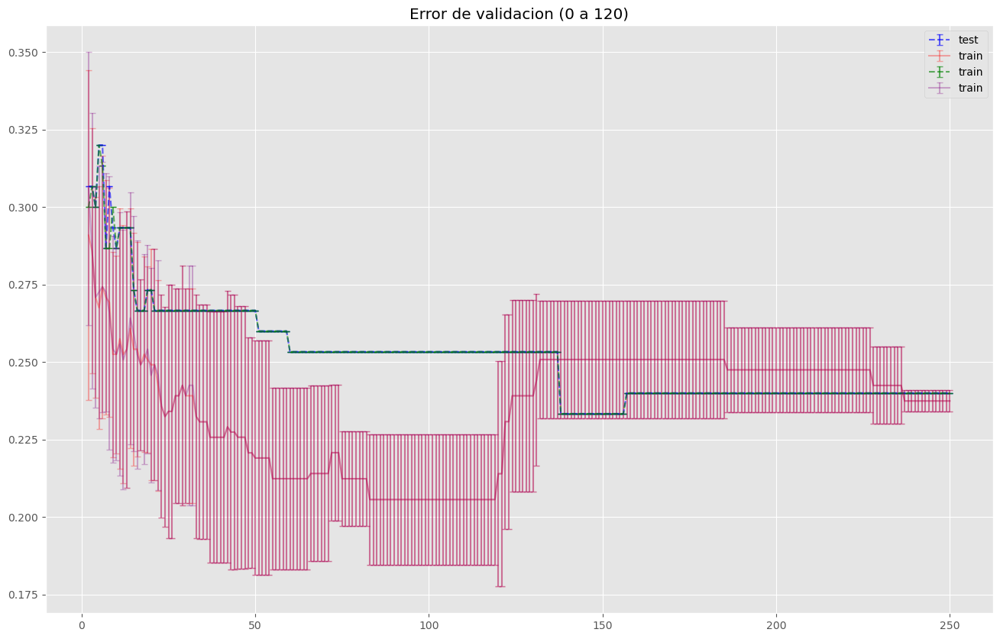

In [64]:
plt.figure(figsize=(16, 10))
plt.title("Error de validacion (0 a 120)")

subset_reduce = cv_results_reduce[test_results_reduce['param_min_samples_split'] <= 250]

subset_test_reduce= test_results_reduce[test_results['param_min_samples_split']<= 250]

subset = cv_results[cv_results['param_min_samples_split'] <= 250]

subset_test= test_results[test_results['param_min_samples_split']<= 250]

plt.errorbar(subset_test['param_min_samples_split'],1 - subset_test['mean_test_score'],
             subset_test['std_test_score'], label='test', capsize=3,alpha=0.6,  color='blue',linestyle='--')  # 1 - [] para imprimir el error

plt.errorbar(subset['param_min_samples_split'],1 - subset['mean_test_score'],
             subset['std_test_score'], label='train', capsize=3,alpha=0.3, color='red', )  # 1 - [] para imprimir el error

plt.errorbar(subset_test_reduce['param_min_samples_split'],1 - subset_test_reduce['mean_test_score'],
             subset_test_reduce['std_test_score'], label='train', capsize=3,alpha=0.6,  color='green', linestyle='--')  # 1 - [] para imprimir el error

plt.errorbar(subset_reduce['param_min_samples_split'],1 - subset_reduce['mean_test_score'],
             subset_reduce['std_test_score'], label='train', capsize=3,alpha=0.3, color='purple')  # 1 - [] para imprimir el error

plt.legend(loc='upper right')
plt.show()

In [65]:
cv_results_best_test = subset_test_reduce[subset_test_reduce['rank_test_score'] == 1].sort_values(by='param_min_samples_split')
cv_results_best_test.loc[:, [ 'param_min_samples_split', 'mean_test_score', 'std_test_score', 'rank_test_score']]

,param_min_samples_split,mean_test_score,std_test_score,rank_test_score
136,138,0.766667,0.0,1
137,139,0.766667,0.0,1
138,140,0.766667,0.0,1
139,141,0.766667,0.0,1
140,142,0.766667,0.0,1
141,143,0.766667,0.0,1
142,144,0.766667,0.0,1
143,145,0.766667,0.0,1
144,146,0.766667,0.0,1
145,147,0.766667,0.0,1


**Modelo selecionado por validación cruzada**

In [66]:
subset_test_reduce.loc[best_value_ind:best_value_ind, [ 'param_min_samples_split', 'mean_test_score', 'std_test_score', 'rank_test_score']]

,param_min_samples_split,mean_test_score,std_test_score,rank_test_score
117,119,0.746667,0.0,461


**Modelo selecionado por regla de la desviación estándar**

In [67]:
subset_test_reduce.loc[valor_ind_cruzado:valor_ind_cruzado, [ 'param_min_samples_split', 'mean_test_score', 'std_test_score', 'rank_test_score']]

,param_min_samples_split,mean_test_score,std_test_score,rank_test_score
119,121,0.746667,0.0,461


En ambos casos comprobamos que los modelos selecionados empeoran entre 1.4 % en comparación 

Comprobamdo si se encuentra un minimo global entre el 20 y el 26 o entorno al 40

En comparación con el de usar todos los modelos hay cierta mejora permitiendo que haya una mayor simplificación del modelo ya que al usar mas vecino suavizamos la frontera

Otro tipo de reduccion

In [68]:
dataset_train_X_reduce = dataset_train.loc[:,["Reciente","Frecuencia","Cantidad_Sangre"]].astype(float)

dataset_test_X_reduce = dataset_test.loc[:, ["Reciente","Frecuencia","Cantidad_Sangre"]].astype(float)


scaler = StandardScaler()

scaler.fit(dataset_train_X_reduce)

dataset_train_X_reduce_scaled = scaler.transform(dataset_train_X_reduce)
dataset_test_X_reduce_scaled = scaler.transform(dataset_test_X_reduce)

dataset_test_X_scaled

# ('Numero de muestras:', 598) auque pone este valor al usar  GridSearchCV me indica que son 477
print("Numero de muestras:", n_samples)


# hay
arbol_clasificador = DecisionTreeClassifier()
modelCV_reduce_2 = GridSearchCV(arbol_clasificador,
                       hyperparameters,
                       cv=5,
                       scoring='accuracy', # parametro  top mejores en regresion mean scare error(skle pueda dar - std)
                       return_train_score=True)  # El warning es normal, pues el ejemplo es demasiado pequeño

np.random.seed(SEED_VALUE)  # Por como funciona KNN, no haría falta establecer una semilla. Pero lo ponemos igualmente
modelCV_reduce_2.fit(dataset_train_X_reduce, dataset_train_Y)  # En KNN no hay aprendizaje en sí, pero hay que ejecutar este comando para poder hacer inferencias

Numero de muestras: 598


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'min_samples_split': range(2, 598)},
             return_train_score=True, scoring='accuracy')

In [69]:
modelCV_reduce_2.fit(dataset_train_X_reduce, dataset_train_Y)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'min_samples_split': range(2, 598)},
             return_train_score=True, scoring='accuracy')

In [70]:
cv_results_reduce_2 = pd.DataFrame(modelCV_reduce_2.cv_results_)
cv_results.loc[:, columna_show].head()

,param_min_samples_split,mean_test_score,rank_test_score
0,2,0.709118,596
1,3,0.714118,595
2,4,0.729146,592
3,5,0.732451,590
4,6,0.725756,594


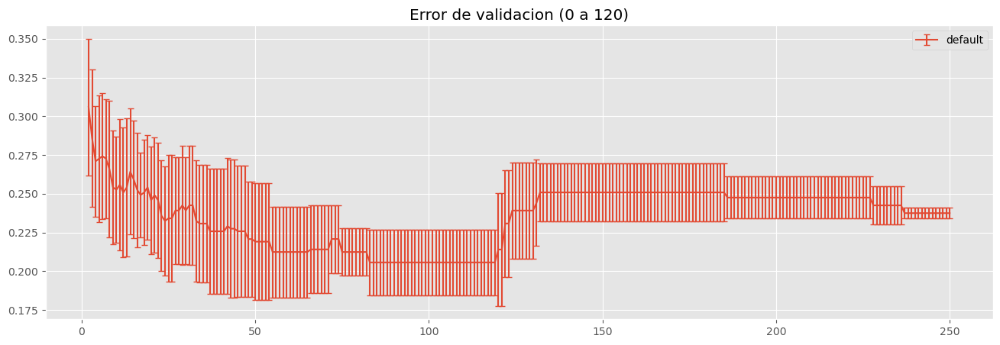

In [71]:
# Primera gráfica: De 0 a 110
plt.figure(figsize=(16, 5))
plt.title("Error de validacion (0 a 120)")
subset = cv_results_reduce[cv_results_reduce['param_min_samples_split'] <= 250]
plt.errorbar(subset['param_min_samples_split'],1 - subset['mean_test_score'],
             subset['std_test_score'], label='default', capsize=3)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

In [72]:
cv_results_best = cv_results_reduce_2[cv_results_reduce_2['rank_test_score'] == 1].sort_values(by='param_min_samples_split')
cv_results_best.loc[:, columna_show]

,param_min_samples_split,mean_test_score,rank_test_score
51,53,0.772563,1
52,54,0.772563,1
53,55,0.772563,1
54,56,0.772563,1
55,57,0.772563,1
56,58,0.772563,1
57,59,0.772563,1
58,60,0.772563,1
59,61,0.772563,1
60,62,0.772563,1


EL comportamientoe es peor como podemos observar almenos en el train

Se ve que empeora como se comento anteriormente en comparacion a lo anterior

### Ejercio 3.

Repite el ejercicio 2 pero para el problema de regresión [Energy Efficiency](https://archive.ics.uci.edu/dataset/242/energy+efficiency) con la variable de salida
cooling load. Al ser un problema de regresión deberás utilizar KNeighborsRegressor, y como medida
de error de entrenamiento y test el MSE.

Nota. Al ser un problema de regresión, para estimar tanto el error de entrenamiento como el de
test (MSE) es necesario desestandarizar los errores calculados. Para desestandarizar el campo
`mean_test_score`, únicamente será necesario multiplicar cada valor por la varianza (cuadrado de la
desviación estándar) de las observaciones de Y del conjunto de entrenamiento. No se debe restar la
media, ya que los campos `splitX_test_score` se calculan como la diferencia entre el valor de
groundtruth y la predicción para cada dato de test, por lo que todas las operaciones de adición o
substracción ya se han tenido en cuenta. De forma similar, para desestandarizar el campo
`std_test_score`, únicamente será necesario multiplicar cada valor por la varianza de las
observaciones de Y del conjunto de entrenamiento.



In [73]:
!pwd

/home/alourido/Desktop/Master_de_big_data_USC/Statistical_learning/practices/5_arboles


In [74]:
DATASET_ENERGY='./data/energy+efficiency/EnergyEfficiency.data'
# Leer el archivo de datos y obtener la primera fila como nombres de columnas
data = pd.read_csv(DATASET_ENERGY)
NAME_ENERGY = data.columns.tolist()
#print(NAME_ENERGY)
#NAME_ENERGY=["Reciente","Frecuencia","Cantidad_Sangre","Tiempo","Donacion_marzo"]


if os.path.exists(DATASET_ENERGY):
    dataset_energy = pd.read_csv(DATASET_ENERGY, 
                          delimiter=DATASET_DELIMITER,
                          header=None,
                          skiprows=1,
                          names = NAME_ENERGY)
else:
    dataset_energy = d.DataFrame(np.array(
    [[0, 3, 2, 1], 
    [3, 0, 3, 0], 
    [0, 3, -1, 0], 
    [3, 0, 0, 1], 
    [1, 2, 1, 1], 
    [2, 1, 0, 0]]), columns=['X1', 'X2', 'X3', 'Y'])
    
dataset_energy.head()

,X1,X2,X3,X4,X5,X6,X7,X8,Y2\t\t
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,28.28


In [75]:
print('Tipo del dato de cada columna:')
print(dataset_energy.dtypes)
# Comprobamos si hay nan
print("\n Cantidad de valores NaN en cada columna:")
dataset_energy.isna().sum()

Tipo del dato de cada columna:
X1        float64
X2        float64
X3        float64
X4        float64
X5        float64
X6          int64
X7        float64
X8          int64
Y2\t\t    float64
dtype: object

 Cantidad de valores NaN en cada columna:


X1        0
X2        0
X3        0
X4        0
X5        0
X6        0
X7        0
X8        0
Y2\t\t    0
dtype: int64

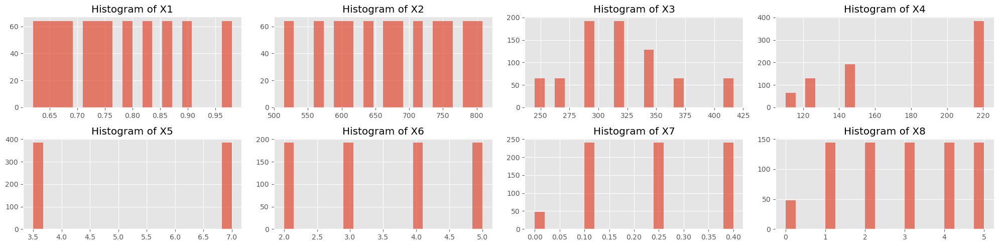

In [76]:
# Excluir la columna de la etiqueta
columns = dataset_energy.columns[:-1]

# Crear una cuadrícula de subtramas 2x4 para histogramas y gráficos de dispersión
fig, axs = plt.subplots(2, 4, figsize=(20, 5))

# Visualizar histogramas para todas las columnas
for i, column in enumerate(columns):
    row = i // 4  # Determinar la fila de la subtrama
    col = i % 4   # Determinar la columna de la subtrama
    axs[row, col].hist(dataset_energy[column], bins=20, alpha=0.7)
    axs[row, col].set_title("Histogram of {}".format(column))
# Ajustar el diseño
plt.tight_layout()
plt.show()

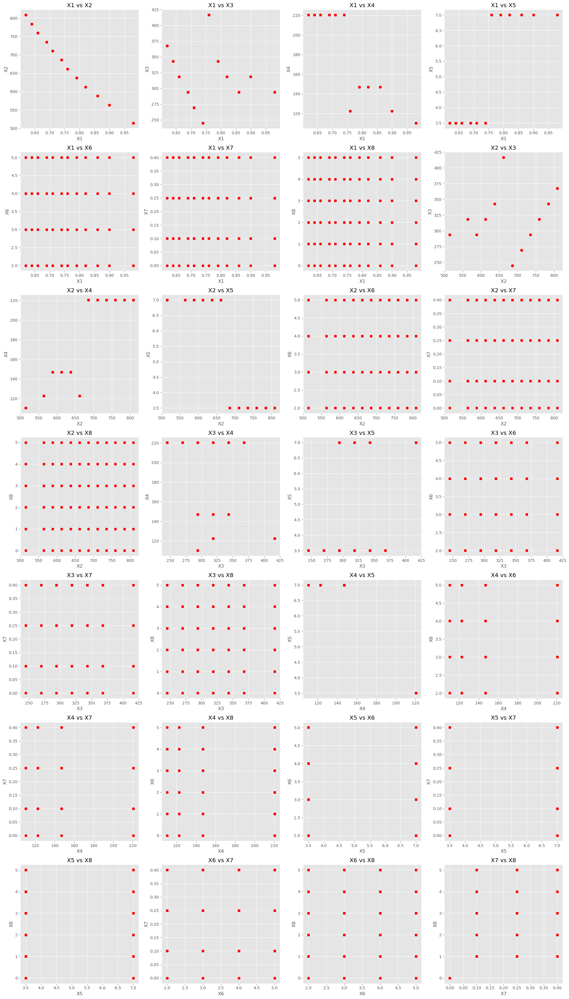

In [77]:
# Crear todas las combinaciones posibles de pares de variables
combinations = list(itertools.combinations(columns, 2))

num_cols=4
# Calcular el número de filas necesario para acomodar todas las combinaciones
num_combinations = len(combinations)
num_rows = num_combinations // num_cols + (num_combinations % num_cols > 0)

# Crear una cuadrícula de subtramas con un número suficiente de filas para todas las combinaciones
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 5))  # Ajustar el tamaño de figura según sea necesario

# Visualizar gráficos de dispersión para todas las combinaciones
for j, (var1, var2) in enumerate(combinations):
    row = j // num_cols
    col = j % num_cols
    axs[row, col].scatter(dataset_energy[var1], 
                          dataset_energy[var2], 
                          c='red')
    axs[row, col].set_title("{} vs {}".format(var1, var2))
    axs[row, col].set_xlabel(var1)
    axs[row, col].set_ylabel(var2)

# Ajustar el diseño para que no haya superposición
plt.tight_layout()

# Mostrar la figura
plt.show()

Se puede observar una cierta relación inversamente proporcional entre X1 Y X2  para otras variables no se opserva relaciones entre ellas.


División de los datos en entrenamiento (80%) y test (20%):

In [78]:
dataset_train_energy, dataset_test_energy = train_test_split(dataset_energy,
                            test_size=0.2, random_state=SEED_VALUE,
                                    )
dataset_test_energy.loc[:,columns].head()

,X1,X2,X3,X4,X5,X6,X7,X8
285,0.62,808.5,367.5,220.5,3.5,3,0.10,5
101,0.90,563.5,318.5,122.5,7.0,3,0.10,2
581,0.90,563.5,318.5,122.5,7.0,3,0.40,2
352,0.79,637.0,343.0,147.0,7.0,2,0.25,2
726,0.90,563.5,318.5,122.5,7.0,4,0.40,5


Este paso no es necesario

In [79]:
#imp = SimpleImputer(missing_values=np.nan, fill_value='mean')
#imp = imp.fit(dataset_train_energy)  # La media la calculamos SÓLO a partir del conjunto de train

# Los valores van a ser los mismos que antes, pues no tenemos datos faltantes
#dataset_train_prep_energy = imp.transform(dataset_train_energy)
#dataset_test_prep_energy = imp.transform(dataset_test_energy)

#dataset_test_prep_energy

In [80]:

#dataset_train_energy = pd.DataFrame(dataset_train_prep_energy,
#                             columns=dataset_train_energy.columns,
#                             index=dataset_train_energy.index)
#dataset_test_energy = pd.DataFrame(dataset_test_prep_energy,
#                            columns=dataset_test_energy.columns,
#                            index=dataset_test_energy.index)

#dataset_test_energy.loc[:,columns]

**Estandarización de los datos**

Esto hay que hacerlo **ANTES** de dividir en conjuntos de entrenamiento y test. Además, como es un problema de **regresion**, estandarizaremos la variable dependientetambien .


In [81]:

scaler = StandardScaler()

scaler.fit(dataset_train_energy)

dataset_train_scaled_energy = scaler.transform(dataset_train_energy)

dataset_test_scaled_energy = scaler.transform(dataset_test_energy)

dataset_test_scaled_energy

array([[-1.33525558,  1.52364121,  1.12278518, ..., -0.99633936,
         1.40105783, -1.09538181],
       [ 1.28346607, -1.23517832,  0.00816901, ..., -0.99633936,
        -0.54374136,  0.54110007],
       [ 1.28346607, -1.23517832,  0.00816901, ...,  1.26941014,
        -0.54374136,  1.17051617],
       ...,
       [ 0.90936298, -0.95929637, -0.54913907, ..., -0.99633936,
         0.10452504,  0.16662393],
       [ 0.53525988, -0.68341441,  0.00816901, ...,  1.26941014,
         0.75279143,  0.40992763],
       [ 0.25468256, -0.40753246,  0.56547709, ...,  1.26941014,
         0.10452504,  1.47094335]])

In [82]:

print("mean [X1, X2, X3, X4, X5, X6, X7, X8,Y2]: {}".format(scaler.mean_))
print("std [X1, X2, X3, X4, X5, X6, X7, X8,Y2]: {}".format(scaler.scale_))


mean [X1, X2, X3, X4, X5, X6, X7, X8,Y2]: [7.62768730e-01 6.73191368e+02 3.18140879e+02 1.77525244e+02
 5.19869707e+00 3.47394137e+00 2.31921824e-01 2.83876221e+00
 2.43248697e+01]
std [X1, X2, X3, X4, X5, X6, X7, X8,Y2]: [ 0.1069224  88.80609907 43.96132191 45.46444155  1.74924784  1.11918644
  0.13240652  1.54257571  9.45320583]


In [83]:
dataset_train_scaled_energy = pd.DataFrame(dataset_train_scaled_energy,
                             columns=dataset_train_energy.columns,
                             index=dataset_train_energy.index)
dataset_test_scaled_energy = pd.DataFrame(dataset_test_scaled_energy,
                            columns=dataset_test_energy.columns,
                            index=dataset_test_energy.index)


dataset_test_scaled_energy.loc[:,columns].head()

,X1,X2,X3,X4,X5,X6,X7,X8
285,-1.335256,1.523641,1.122785,0.945239,-0.971101,-0.423470,-0.996339,1.401058
101,1.283466,-1.235178,0.008169,-1.210292,1.029759,-0.423470,-0.996339,-0.543741
581,1.283466,-1.235178,0.008169,-1.210292,1.029759,-0.423470,1.269410,-0.543741
352,0.254683,-0.407532,0.565477,-0.671409,1.029759,-1.316976,0.136535,-0.543741
726,1.283466,-1.235178,0.008169,-1.210292,1.029759,0.470037,1.269410,1.401058


**SEPARAMOS LAS VARIABLES**

In [84]:
dataset_train_X_energy = dataset_train_scaled_energy.loc[:, NAME_ENERGY[:-1]].astype(float)
dataset_train_Y_energy = dataset_train_scaled_energy.loc[:, NAME_ENERGY[-1]]
dataset_train_X_energy.head()

,X1,X2,X3,X4,X5,X6,X7,X8
663,-0.961152,0.971877,0.008169,0.945239,-0.971101,1.363543,1.269410,0.104525
712,-1.148204,1.247759,0.565477,0.945239,-0.971101,-1.316976,1.269410,0.752791
161,0.254683,-0.407532,0.565477,-0.671409,1.029759,-0.423470,-0.996339,0.104525
509,-0.493524,0.420113,-1.106447,0.945239,-0.971101,-0.423470,0.136535,1.401058
305,0.254683,-0.407532,0.565477,-0.671409,1.029759,-0.423470,0.136535,-1.192008


In [85]:
dataset_test_X_energy = dataset_test_scaled_energy.loc[:, NAME_ENERGY[:-1]].astype(float)
dataset_test_Y_energy = dataset_test_scaled_energy.loc[:, NAME_ENERGY[-1]]

dataset_test_Y_energy.head()

285   -1.095382
101    0.541100
581    1.170516
352    2.066509
726    1.530183
Name: Y2\t\t, dtype: float64

In [86]:
#Expected n_neighbors <= n_samples,  but n_samples = 491, n_neighbors = 492
# Expected n_neighbors <= n_samples,  n_samples = 477
# Si solo necesitas el número de muestras
n_samples = dataset_train_X_energy.shape[0]

# ('Numero de muestras:', 614) auque pone este valor al usar  GridSearchCV me indica que son 491
print("Numero de muestras:", n_samples)

hyperparameters = {
    'min_samples_split': range(2, n_samples, 1)}
  


Numero de muestras: 614


In [87]:
dataset_train_X_energy.index.equals(dataset_train_Y_energy.index)

True

In [88]:
arbol = DecisionTreeRegressor()
modelCV_energy = GridSearchCV(arbol,
                       hyperparameters,
                       cv=5,
                       scoring="neg_mean_squared_error",
                       return_train_score=True)

# Por como funciona KNN, no haría falta establecer una semilla. Pero lo ponemos igualmente
np.random.seed(SEED_VALUE)

# En KNN no hay aprendizaje en sí, pero hay que ejecutar este comando para poder hacer inferencias
modelCV_energy.fit(dataset_train_X_energy, dataset_train_Y_energy)


GridSearchCV(cv=5, estimator=DecisionTreeRegressor(),
             param_grid={'min_samples_split': range(2, 614)},
             return_train_score=True, scoring='neg_mean_squared_error')

In [89]:
cv_results_energy = pd.DataFrame(modelCV_energy.cv_results_)
cv_results_energy.loc[:, [ 'param_min_samples_split', 'mean_test_score', 'std_test_score', 'rank_test_score']]
cv_results_energy['destandardized_mean_test_score'] = (-1) * cv_results_energy['mean_test_score'] * (scaler.scale_[8]**2)
cv_results_energy['destandardized_std_test_score'] = cv_results_energy['std_test_score'] * (scaler.scale_[8]**2)

In [90]:
cv_results_best = cv_results_energy[cv_results_energy['rank_test_score'] == 1]
colums_selected= [ 'param_min_samples_split', 'mean_test_score', 'std_test_score'
                        ,'destandardized_mean_test_score','destandardized_std_test_score','rank_test_score']
cv_results_best.loc[:, colums_selected]

,param_min_samples_split,mean_test_score,std_test_score,destandardized_mean_test_score,destandardized_std_test_score,rank_test_score
13,15,-0.038047,0.007703,3.400035,0.68836,1


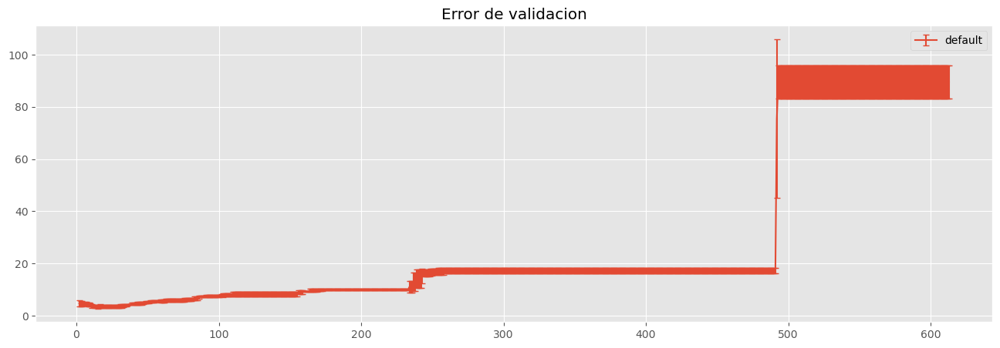

In [91]:
# separamos los pesos basados en cada 
cv_results_uniform = cv_results

plt.figure(figsize=(16, 5))  # Puedes cambiar estos valores según tus necesidades
# eje x xantidad de vecinos y en el y cuanto es el errror
plt.title("Error de validacion")
plt.errorbar(cv_results_energy['param_min_samples_split'],cv_results_energy['destandardized_mean_test_score'],
             cv_results_energy['destandardized_std_test_score'], label='default', capsize=3)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

In [92]:
cv_results_best = cv_results_energy[cv_results_energy['rank_test_score'] == 1]
cv_results_best.loc[:, colums_selected]

,param_min_samples_split,mean_test_score,std_test_score,destandardized_mean_test_score,destandardized_std_test_score,rank_test_score
13,15,-0.038047,0.007703,3.400035,0.68836,1


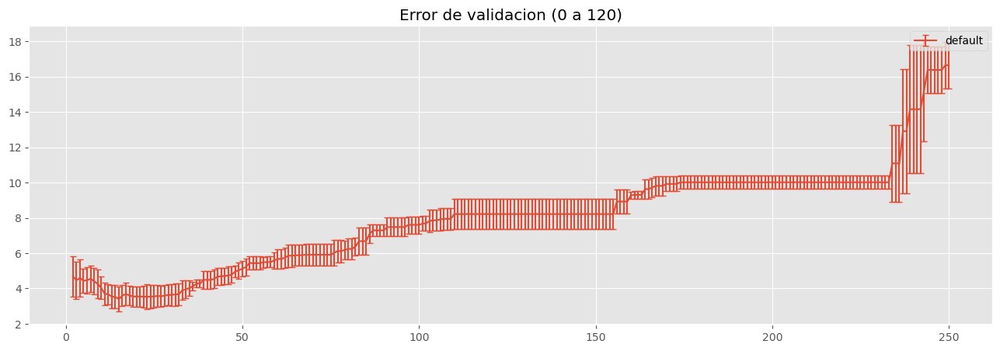

In [93]:
# Primera gráfica: De 0 a 110
plt.figure(figsize=(16, 5))
plt.title("Error de validacion (0 a 120)")
subset = cv_results_energy[cv_results_energy['param_min_samples_split'] <= 250]
plt.errorbar(subset['param_min_samples_split'],subset['destandardized_mean_test_score'],
             subset['destandardized_std_test_score'], label='default', capsize=3)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

In [94]:
cv_results_best = cv_results_energy
cv_results_best.loc[:,colums_selected].sort_values(by='rank_test_score').head()

,param_min_samples_split,mean_test_score,std_test_score,destandardized_mean_test_score,destandardized_std_test_score,rank_test_score
13,15,-0.038047,0.007703,3.400035,0.688360,1
12,14,-0.039367,0.007374,3.517948,0.658958,2
22,24,-0.039528,0.007522,3.532346,0.672223,3
21,23,-0.039542,0.007721,3.533609,0.689998,4
20,22,-0.039548,0.006708,3.534107,0.599468,5


In [95]:
cv_results_best = cv_results_energy[cv_results_energy['rank_test_score'] == 1]
cv_results_best.loc[:, colums_selected]
best_value=cv_results_energy.loc[:, columna_show]
best_value_ind_energy=cv_results_best.index[-1]
print(best_value_ind_energy)

13


In [96]:
# Aplicar la regla de una desviación estándar
best_model = cv_results_energy[cv_results_energy['rank_test_score'] == 1].sort_values(by='param_min_samples_split').iloc[0]
mejor_score = best_model['destandardized_mean_test_score']
mejor_std = best_model['destandardized_std_test_score']

threshold_energy=mejor_score+mejor_std
print(threshold_energy)
cv_results_aux = cv_results_energy[
     cv_results_energy['destandardized_mean_test_score']<=threshold_energy
].sort_values(by='param_min_samples_split', ascending=False)

cv_results_aux = cv_results_aux.loc[:, colums_selected]

cv_results_aux = cv_results_aux.sort_values(by='param_min_samples_split')
cv_results_aux


4.088394538421466


,param_min_samples_split,mean_test_score,std_test_score,destandardized_mean_test_score,destandardized_std_test_score,rank_test_score
8,10,-0.045226,0.007286,4.041511,0.651140,26
9,11,-0.041368,0.007139,3.696796,0.637991,22
10,12,-0.041079,0.006434,3.670935,0.574995,20
11,13,-0.039614,0.007391,3.540002,0.660456,6
12,14,-0.039367,0.007374,3.517948,0.658958,2
13,15,-0.038047,0.007703,3.400035,0.688360,1
14,16,-0.040301,0.006583,3.601390,0.588233,14
15,17,-0.041154,0.007188,3.677685,0.642317,21
16,18,-0.040382,0.006238,3.608691,0.557408,15
17,19,-0.039707,0.006350,3.548382,0.567428,8


In [97]:
valor_ind_cruzado_energy=cv_results_aux.index[-1]#get_val_cross_validater(cv_results_aux
                         #                 ,best_value_ind_energy)
print(valor_ind_cruzado_energy)

33


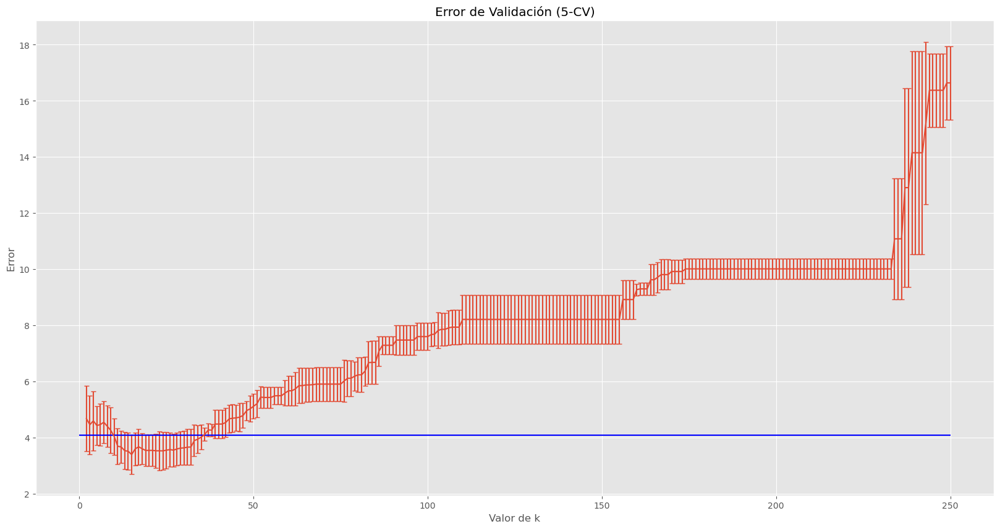

In [98]:


fig, ax = plt.subplots(figsize=(20, 10), ncols=1, nrows=1)
ax.set_title("Error de Validación (5-CV)")
ax.set_xlabel("Valor de k")
ax.set_ylabel("Error")
ubset = cv_results_energy[cv_results_energy['param_min_samples_split'] <= 250]
plt.errorbar(subset['param_min_samples_split'],subset['destandardized_mean_test_score'],
             subset['destandardized_std_test_score'], label='default', capsize=3)  # 1 - [] para imprimir el error
ax.hlines(y=threshold_energy, xmin=0, xmax=250, colors='blue')



En este caso se el valor que se obtiene como el mejor y el que da el la regla de una desviación estándar seria la misma cantidad de neighbors


In [99]:
# Hacemos un Grid Search sin Cross Validation, únicamente con entrenamieto y validación (PredefinedSplit)

# Creamos una lista con `-1` para los índices de entrenamiento y `0` para los índices de validación
split_test_fold = [-1]*len(dataset_train_Y_energy) + [0]*len(dataset_test_Y_energy)
ps = PredefinedSplit(test_fold=split_test_fold)

# Juntamos los conjuntos de entrenamiento y test, fingiendo que son un sólo conjunto de entrenamiento-validación
dataset_all_X_scaled = np.vstack([dataset_train_X_energy, dataset_test_X_energy])
dataset_all_Y = pd.concat([dataset_train_Y_energy, dataset_test_Y_energy])

arbol = DecisionTreeRegressor()
modelCV_test_energy = GridSearchCV(arbol,
                       hyperparameters,
                       cv=ps,
                       scoring='neg_mean_squared_error',
                       return_train_score=True)

np.random.seed(SEED_VALUE)  # Por como funciona KNN, no haría falta establecer semilla. Pero lo ponemos igualmente
modelCV_test_energy.fit(dataset_all_X_scaled, dataset_all_Y)

GridSearchCV(cv=PredefinedSplit(test_fold=array([-1, -1, ...,  0,  0])),
             estimator=DecisionTreeRegressor(),
             param_grid={'min_samples_split': range(2, 614)},
             return_train_score=True, scoring='neg_mean_squared_error')

In [100]:
test_results_energy = pd.DataFrame(modelCV_test_energy.cv_results_)
test_results_energy['destandardized_mean_test_score'] = (-1) * test_results_energy['mean_test_score'] * (scaler.scale_[8]**2)
test_results_energy['destandardized_std_test_score'] = test_results_energy['std_test_score'] * (scaler.scale_[8]**2)
test_results_energy.loc[:, colums_selected]

,param_min_samples_split,mean_test_score,std_test_score,destandardized_mean_test_score,destandardized_std_test_score,rank_test_score
0,2,-0.073576,0.0,6.575013,0.0,99
1,3,-0.060104,0.0,5.371108,0.0,71
2,4,-0.056486,0.0,5.047736,0.0,50
3,5,-0.057046,0.0,5.097793,0.0,52
4,6,-0.056695,0.0,5.066433,0.0,51
...,...,...,...,...,...,...
607,609,-0.232756,0.0,20.799770,0.0,419
608,610,-0.232756,0.0,20.799770,0.0,419
609,611,-0.232756,0.0,20.799770,0.0,419
610,612,-0.232756,0.0,20.799770,0.0,419


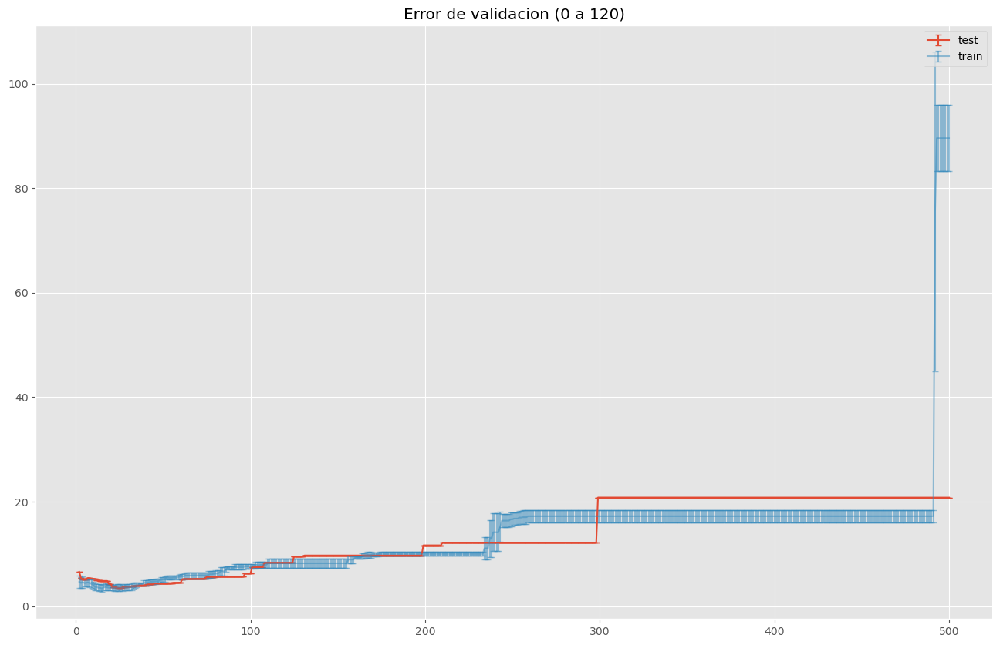

In [101]:
plt.figure(figsize=(16, 10))
plt.title("Error de validacion (0 a 120)")
subset = cv_results_energy[cv_results_energy['param_min_samples_split'] <= 500]
subset_test= test_results_energy[test_results_energy['param_min_samples_split']<= 500]
plt.errorbar(subset_test['param_min_samples_split'],subset_test['destandardized_mean_test_score'],
             subset_test['destandardized_std_test_score'], label='test', capsize=3)  # 1 - [] para imprimir el error

plt.errorbar(subset['param_min_samples_split'],subset['destandardized_mean_test_score'],
             subset['destandardized_std_test_score'], label='train', capsize=3,alpha=0.5)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

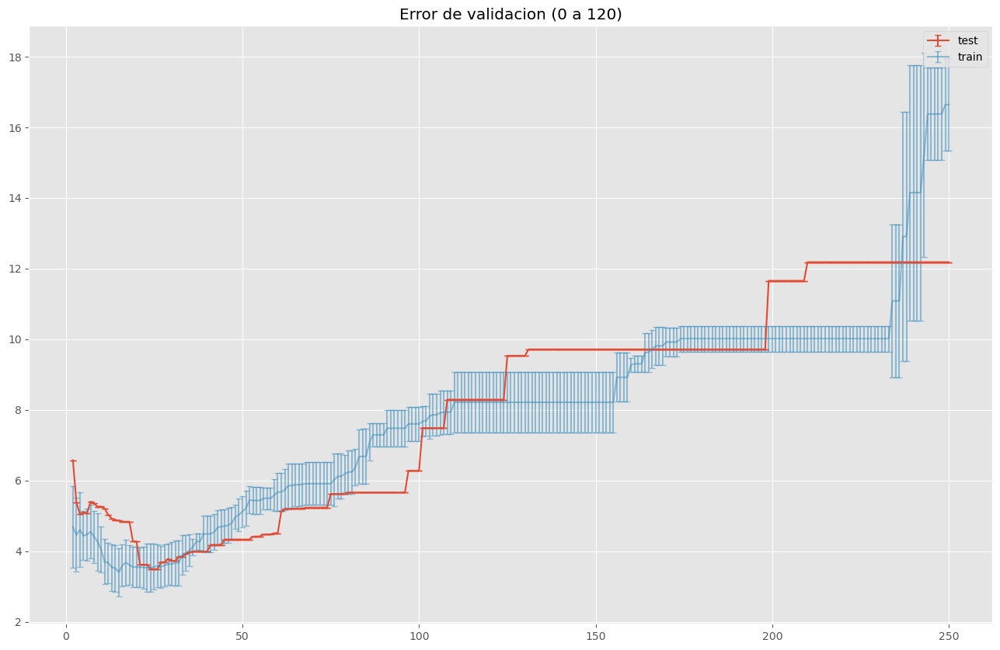

In [102]:
plt.figure(figsize=(16, 10))
plt.title("Error de validacion (0 a 120)")
subset = cv_results_energy[cv_results_energy['param_min_samples_split'] <= 250]
subset_test= test_results_energy[test_results_energy['param_min_samples_split']<= 250]
plt.errorbar(subset_test['param_min_samples_split'],subset_test['destandardized_mean_test_score'],
             subset_test['destandardized_std_test_score'], label='test', capsize=3)  # 1 - [] para imprimir el error

plt.errorbar(subset['param_min_samples_split'],subset['destandardized_mean_test_score'],
             subset['destandardized_std_test_score'], label='train', capsize=3,alpha=0.5)  # 1 - [] para imprimir el error
plt.legend(loc='upper right')
plt.show()

In [103]:
test_results_energy.loc[:, colums_selected].sort_values(by='destandardized_mean_test_score').head()

,param_min_samples_split,mean_test_score,std_test_score,destandardized_mean_test_score,destandardized_std_test_score,rank_test_score
22,24,-0.039077,0.0,3.492052,0.0,1
24,26,-0.039077,0.0,3.492052,0.0,1
23,25,-0.039077,0.0,3.492052,0.0,3
19,21,-0.040491,0.0,3.618426,0.0,4
21,23,-0.040495,0.0,3.618776,0.0,5


In [104]:
test_results_energy.loc[best_value_ind_energy:best_value_ind_energy, colums_selected].sort_values(by='destandardized_mean_test_score').head()

,param_min_samples_split,mean_test_score,std_test_score,destandardized_mean_test_score,destandardized_std_test_score,rank_test_score
13,15,-0.054498,0.0,4.87007,0.0,46


In [105]:
test_results_energy.loc[valor_ind_cruzado_energy:valor_ind_cruzado_energy, colums_selected].sort_values(by='destandardized_mean_test_score').head()

,param_min_samples_split,mean_test_score,std_test_score,destandardized_mean_test_score,destandardized_std_test_score,rank_test_score
33,35,-0.044436,0.0,3.970903,0.0,15


En este caso el valor que selencionamos bastante diferencia con el modelo que mejores valores obtenido en el test 